# Influence optical parameters on the LCE

In [2]:
## Imports:

import numpy as np
import matplotlib
from matplotlib.colors import LogNorm
from matplotlib.ticker import AutoMinorLocator
import matplotlib.pyplot as plt
from matplotlib import gridspec            # to arrange the plots nicely
%matplotlib inline
import concurrent.futures

import uproot                              # uproot for easy import of ROOT tree contents
import collections                         # used for named tuples
import pandas as pd
import math
import ast
from scipy import optimize
from scipy.optimize import curve_fit
from scipy.optimize import minimize
from numpy import exp
from pylab import meshgrid,cm,imshow,contour,clabel,colorbar,axis,title,show
import matplotlib.patches as patches
import matplotlib.cbook as cbook
from scipy.interpolate import spline
from scipy.interpolate import make_interp_spline, BSpline

In [3]:
## Function definitions:

def f_polar_R(cartesian_x, cartesian_y):
    return np.sqrt(cartesian_x * cartesian_x + cartesian_y * cartesian_y)

def f_polar_Phi(cartesian_x, cartesian_y):
    return np.arctan2(cartesian_y, cartesian_x)

def f_distance(x_a, y_a, x_b, y_b):
    return np.sqrt((x_b - x_a)**2 + (y_b - y_a)**2)


def flatten_tuples(tup):
    return np.array([element for tupl in tup for element in tupl])

def sum_tuple_subentries(tup):
    return [np.sum(tupl) for tupl in tup]

def nth_tuple_subentries(tup, n):
    return [tupl[n] for tupl in tup]


def from_np_array(array_string):
    array_string = ','.join(array_string.replace('[ ', '[').split())
    return np.array(ast.literal_eval(array_string))


def remove_duplicate(input_list, inputcritical_list): 
    final_list = []
    finalcritical_list = []
    for i in range(0, len(inputcritical_list)): 
        if inputcritical_list[i] not in finalcritical_list: 
            finalcritical_list.append(inputcritical_list[i]) 
            final_list.append(input_list[i])
    return final_list 

In [4]:
## PMT properties and physics:

QE_PMT0 = 0.325
QE_PMT1 = 0.3
QE_PMT2 = 0.3
QE_PMT3 = 0.3
QE_PMT4 = 0.3
QE_PMT5 = 0.3
QE_PMT6 = 0.3
QE_PMT7 = 0.3
QE_Bottom = QE_PMT0
QE_Top = 0.3

CE_PMT0 = 0.95
CE_PMT1 = 0.7
CE_PMT2 = 0.7
CE_PMT3 = 0.7
CE_PMT4 = 0.7
CE_PMT5 = 0.7
CE_PMT6 = 0.7
CE_PMT7 = 0.7
CE_Bottom = CE_PMT0
CE_Top = 0.7

W = 1/(1302.808447/32.1517) # 1/W = photons/keV @ 32.1517 keV, 500 V/cm, ER
print('1/W  = '+str(1/W)+' ph/keV')
We = 1/(1045.457843/32.1517) # 1/W = electrons/keV @ 32.1517 keV, 500 V/cm, ER
print('1/We = '+str(1/We)+' e/keV')

W0 = 1/(2195.519/32.1517) # 1/W = photons/keV @ 32.1517 keV, 0.0001 V/cm, ER
print('1/W0  = '+str(1/W0)+' ph/keV')

1/W  = 40.52067066438166 ph/keV
1/We = 32.51640949001141 e/keV
1/W0  = 68.28624924965087 ph/keV


## Imports and data processing

In [5]:
## Available ROOT files in specified folder:
#! ls ../../Xebra_G4/*.root
#! ls ../../Simulation_Data/LCE/*.root
#! ls ../../Simulation_Data/Modification_Spacer_3/*.root
! ls /media/ab602/TOSHIBA\ EXT/Simulation_Data/Influence_Optical_Parameters

optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.3_LXeAbs1000_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.3_LXeAbs100_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.3_LXeAbs10_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.4_LXeAbs1000_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.4_LXeAbs100_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.4_LXeAbs10_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.5_LXeAbs1000_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.5_LXeAbs100_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.5_LXeAbs10_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.6_LXeAbs1000_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.6_LXeAbs100_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.6_LXeAbs10_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.7_LXeAbs1000_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.7_LXeAbs100_Tmesh0.89770509.root
optPhot_S1_1.0e+07_pmtGap4.5_RPTF

In [6]:
b_preprocessed = False

if b_preprocessed == False:
    
    ## Selection of path with files to be analysed
    from os import listdir
    from os.path import isfile, join
    path = "/media/ab602/TOSHIBA EXT/Simulation_Data/Influence_Optical_Parameters"
    files = [f for f in listdir(path) if isfile(join(path, f))]
    #files = files[0:3]

    ## Initialize empty dataframe
    opticals = pd.DataFrame({'RPTFE' : [], 'LXeAbs' : [], 'Tmesh' : [], 'LCE_b' : [],'LCE_t' : [],'LCE_a' : []})

    counter = 0
    for file in files:

        ## Selection of file to be analyzed:
        #file = "optPhot_S1_1.0e+07_pmtGap4.5_RPTFE0.95_LXeAbs100.root"
        filename = path+"/"+file
        #filenameprefix = file[:-5]    
        #print(filenameprefix)

        ## Extraction of optical parameters from filename
        RPTFE = float(file[file.find("RPTFE")+5 : file.find("_", file.find("RPTFE")+5)])
        if file.find("Tmesh") is -1:
            LXeAbs = float(file[file.find("LXeAbs")+6 : file.find(".root")])
            Tmesh = 0.89770509
        if file.find("Tmesh") is not -1:
            LXeAbs = float(file[file.find("LXeAbs")+6 : file.find("_", file.find("LXeAbs")+6)])
            Tmesh = float(file[file.find("Tmesh")+5 : file.find(".root")])

        ## Import as pandas dataframes and write to compressed dataframe
        branches= ['nbpmthits','ntpmthits'] # Be careful that the branches are also initilized in _chunk_collect
        executor = concurrent.futures.ThreadPoolExecutor(8)
        _chunk_collect = pd.DataFrame({'nbpmthits' : [],'ntpmthits' : []}) # Initialize empty data frame
        for _chunk in uproot.iterate(filename, "events/events",branches, entrysteps=100000, 
                                               outputtype=pd.DataFrame, executor=executor):
            _chunk.columns=branches
            _chunk_collect = _chunk_collect.append(_chunk)
        LCE_b = _chunk_collect["nbpmthits"].mean()
        LCE_t = _chunk_collect["ntpmthits"].mean()
        LCE_a = LCE_b + LCE_t
        opticals = opticals.append(pd.DataFrame({'RPTFE' : [RPTFE], 'LXeAbs' : [LXeAbs], 'Tmesh' : [Tmesh], 'LCE_b' : [LCE_b],'LCE_t' : [LCE_t],'LCE_a' : [LCE_a]}), ignore_index=True)
        del(_chunk)
        del(_chunk_collect)
        
        counter += 1
        print(str(round(100*counter / len(files),1))+'%', end = ' ')

    ## Derive DE and LY
    opticals['DE_b'] = opticals['LCE_b'] * QE_Bottom * CE_Bottom
    opticals['DE_t'] = opticals['LCE_t'] * QE_Top * CE_Top
    opticals['DE_a'] = opticals['DE_b'] + opticals['DE_t']
    opticals['LY_b'] = opticals['DE_b']/W
    opticals['LY_t'] = opticals['DE_t']/W
    opticals['LY_a'] = opticals['LY_b'] + opticals['LY_t']
    opticals['LY0_b'] = opticals['DE_b']/W0
    opticals['LY0_t'] = opticals['DE_t']/W0
    opticals['LY0_a'] = opticals['LY0_b'] + opticals['LY0_t']

    ## Save to pickle file
    opticals.to_pickle("Influence_optical_parameters.pkl")

if b_preprocessed == True:
    opticals = pd.read_pickle("output/Influence_optical_parameters.pkl")

print('Done.')
opticals

/home/ab602/anaconda3/lib/python3.7/site-packages/uproot/tree.py:116: FutureWarning: Int64Index.data is deprecated and will be removed in a future version
  index = awkward.numpy.frombuffer(arrays.index.data, dtype=arrays.index.dtype)


0.9% 1.8% 2.7% 3.5% 4.4% 5.3% 6.2% 7.1% 8.0% 8.8% 9.7% 10.6% 11.5% 12.4% 13.3% 14.2% 15.0% 15.9% 16.8% 17.7% 18.6% 19.5% 20.4% 21.2% 22.1% 23.0% 23.9% 24.8% 25.7% 26.5% 27.4% 28.3% 29.2% 30.1% 31.0% 31.9% 32.7% 33.6% 34.5% 35.4% 36.3% 37.2% 38.1% 38.9% 39.8% 40.7% 41.6% 42.5% 43.4% 44.2% 45.1% 46.0% 46.9% 47.8% 48.7% 49.6% 50.4% 51.3% 52.2% 53.1% 54.0% 54.9% 55.8% 56.6% 57.5% 58.4% 59.3% 60.2% 61.1% 61.9% 62.8% 63.7% 64.6% 65.5% 66.4% 67.3% 68.1% 69.0% 69.9% 70.8% 71.7% 72.6% 73.5% 74.3% 75.2% 76.1% 77.0% 77.9% 78.8% 79.6% 80.5% 81.4% 82.3% 83.2% 84.1% 85.0% 85.8% 86.7% 87.6% 88.5% 89.4% 90.3% 91.2% 92.0% 92.9% 93.8% 94.7% 95.6% 96.5% 97.3% 98.2% 99.1% 100.0% Done.


,RPTFE,LXeAbs,Tmesh,LCE_b,LCE_t,LCE_a,DE_b,DE_t,DE_a,LY_b,LY_t,LY_a,LY0_b,LY0_t,LY0_a
0,0.300,1000.0,0.897705,0.092872,0.016654,0.109527,0.028674,0.003497,0.032172,1.161904,0.141716,1.303620,1.958064,0.238823,2.196887
1,0.300,100.0,0.897705,0.088092,0.016066,0.104158,0.027198,0.003374,0.030572,1.102095,0.136709,1.238804,1.857273,0.230384,2.087657
2,0.300,10.0,0.897705,0.053917,0.011104,0.065021,0.016647,0.002332,0.018979,0.674542,0.094485,0.769028,1.136753,0.159228,1.295981
3,0.400,1000.0,0.897705,0.106395,0.018322,0.124717,0.032849,0.003848,0.036697,1.331082,0.155907,1.486989,2.243166,0.262738,2.505904
4,0.400,100.0,0.897705,0.100036,0.017419,0.117455,0.030886,0.003658,0.034544,1.251524,0.148225,1.399749,2.109093,0.249792,2.358885
5,0.400,10.0,0.897705,0.058695,0.011679,0.070374,0.018122,0.002453,0.020575,0.734323,0.099377,0.833700,1.237495,0.167472,1.404968
6,0.500,1000.0,0.897705,0.122910,0.020199,0.143109,0.037949,0.004242,0.042190,1.537700,0.171881,1.709581,2.591362,0.289657,2.881020
7,0.500,100.0,0.897705,0.114536,0.019169,0.133705,0.035363,0.004026,0.039389,1.432933,0.163118,1.596051,2.414808,0.274890,2.689698
8,0.500,10.0,0.897705,0.063937,0.012410,0.076347,0.019741,0.002606,0.022347,0.799899,0.105599,0.905498,1.348006,0.177958,1.525964
9,0.600,1000.0,0.897705,0.143846,0.022840,0.166686,0.044412,0.004796,0.049209,1.799617,0.194354,1.993972,3.032751,0.327530,3.360281


In [7]:
plt.rcParams['axes.axisbelow'] = True

## Influence of the PTFE Reflectivity on the LCE

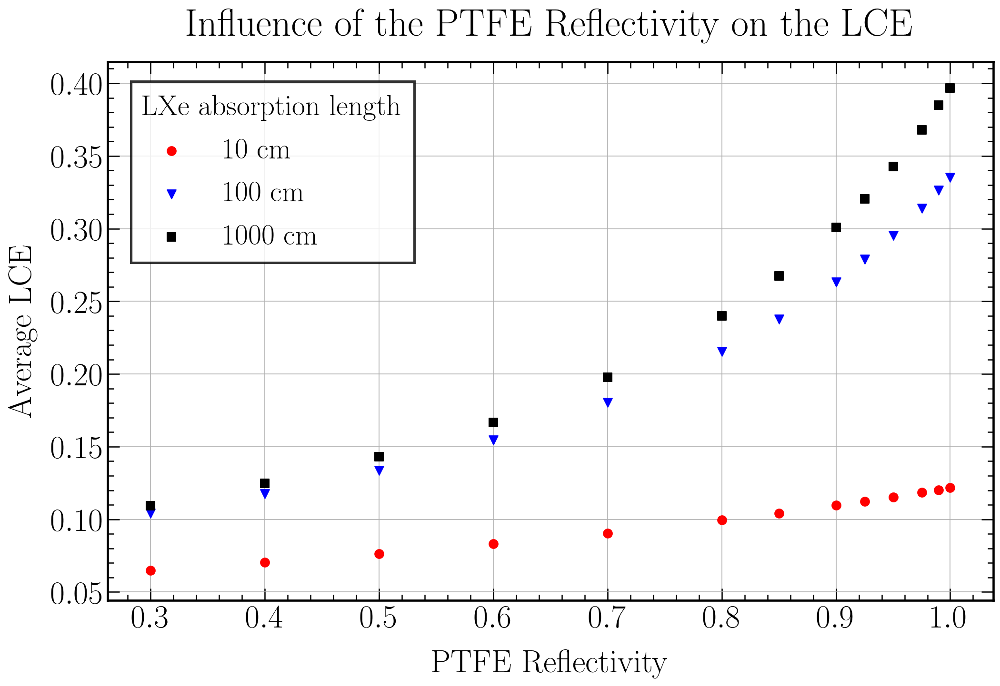

In [8]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the LCE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="LXe absorption length", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.0,0.4)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_LCE.png")
plt.show()

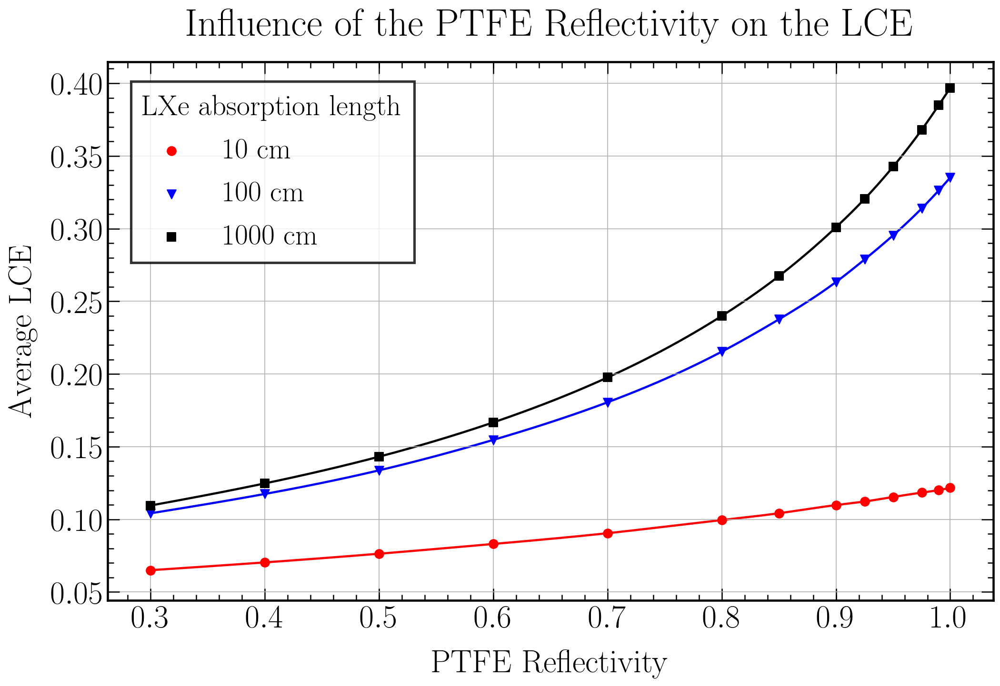

In [9]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the LCE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="LXe absorption length", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.0,0.4)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_LCE_spline.png")
plt.show()

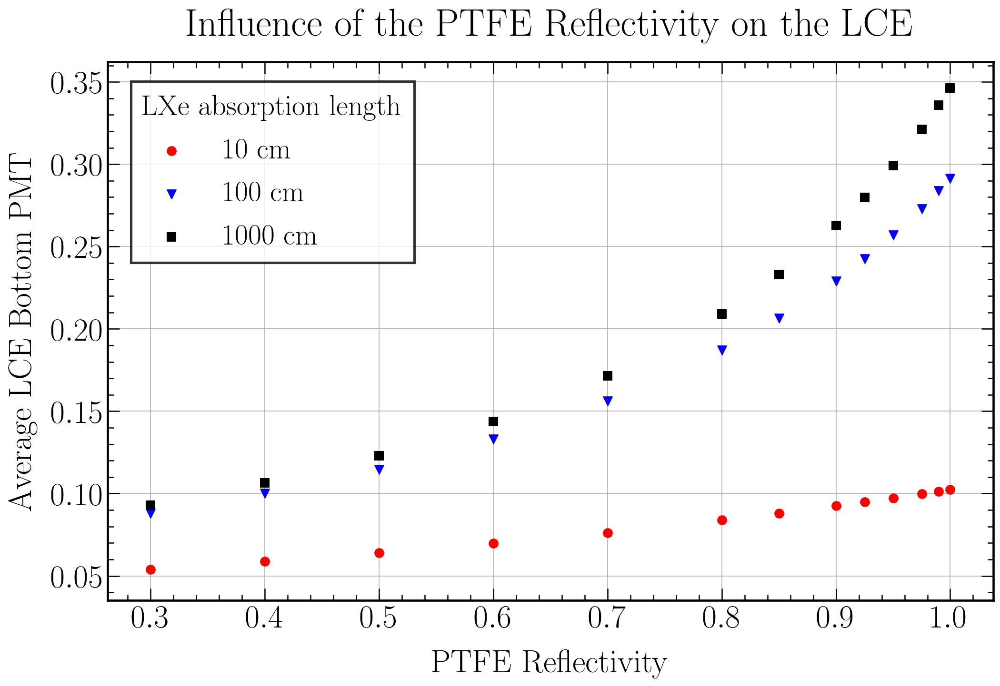

In [10]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the LCE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="LXe absorption length", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.0,0.4)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_LCE_Bottom.png")
plt.show()

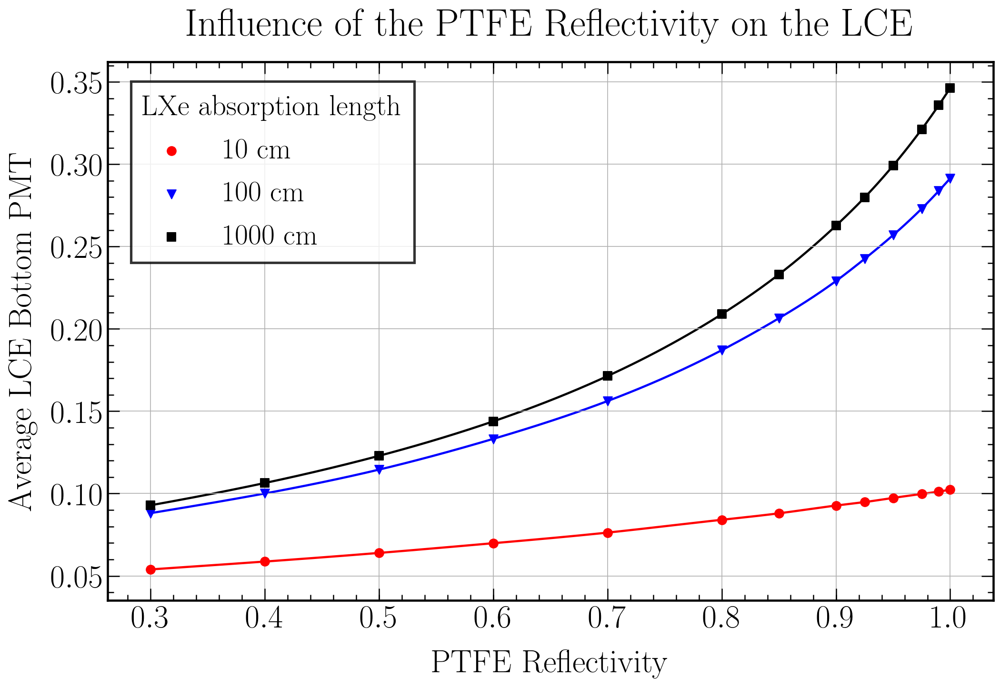

In [11]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the LCE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="LXe absorption length", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.0,0.4)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_LCE_Bottom_spline.png")
plt.show()

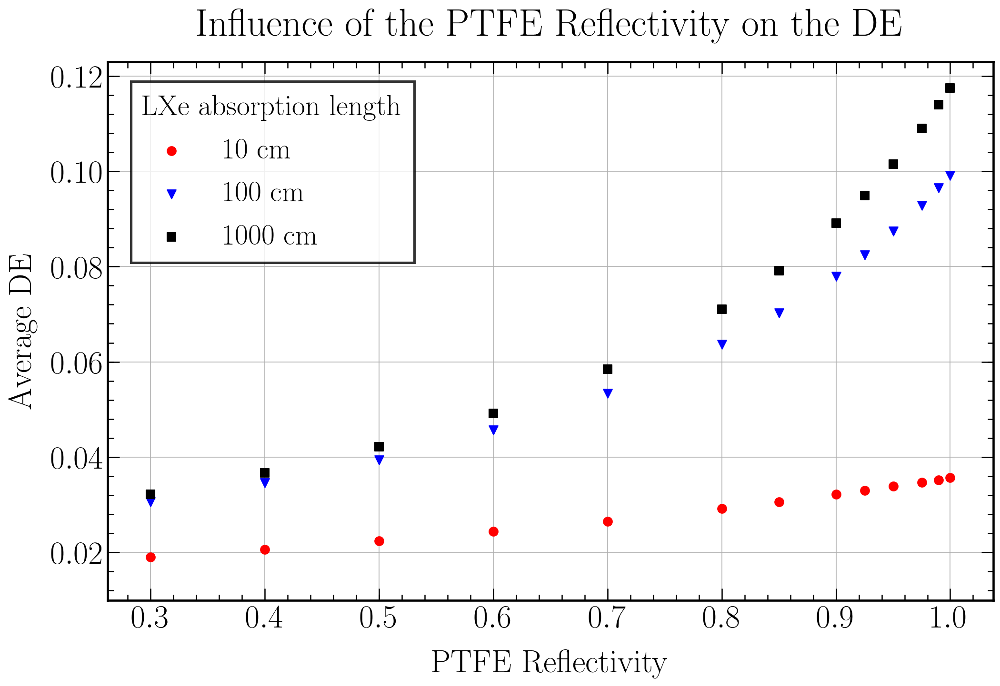

In [12]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the DE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="LXe absorption length", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.02,0.104)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_DE.png")
plt.show()

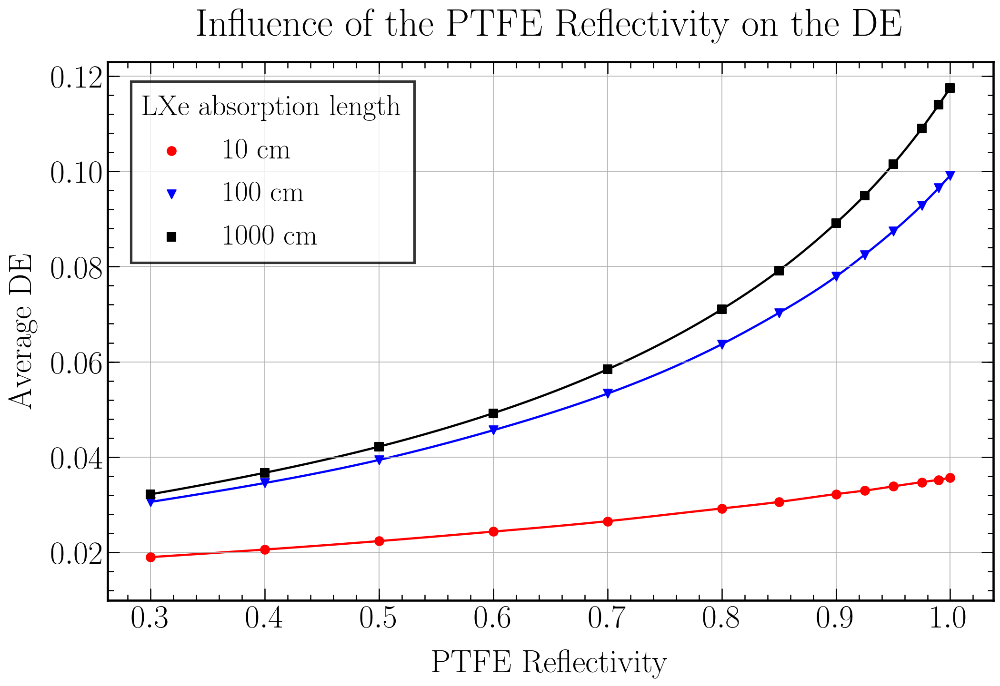

In [13]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the DE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="LXe absorption length", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.02,0.104)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_DE_spline.png")
plt.show()

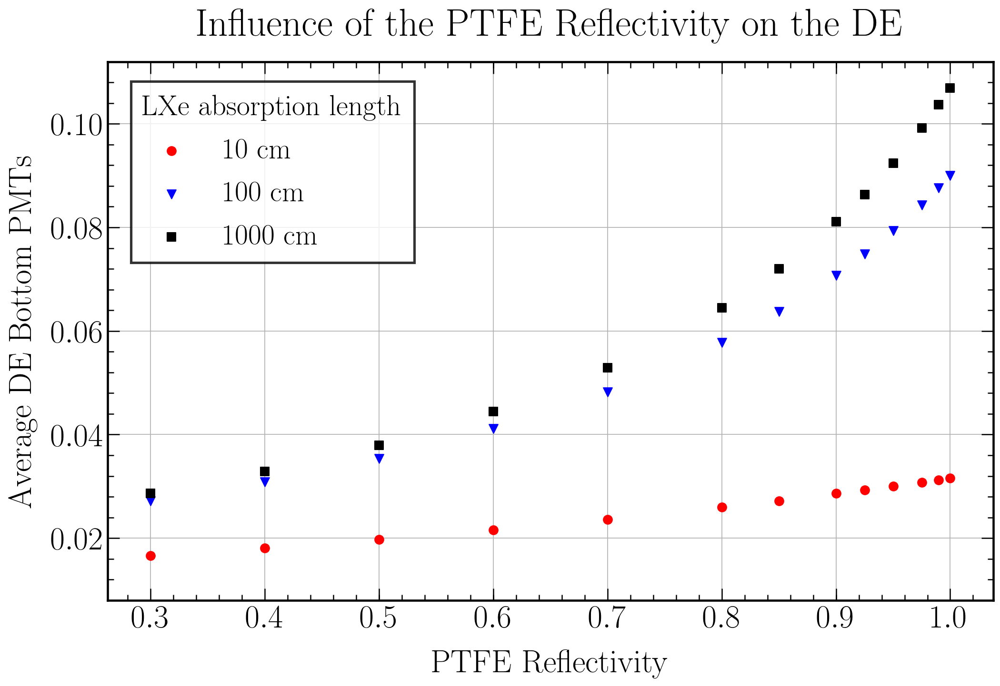

In [14]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE Bottom PMTs', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the DE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="LXe absorption length", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.02,0.104)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_DE_Bottom.png")
plt.show()

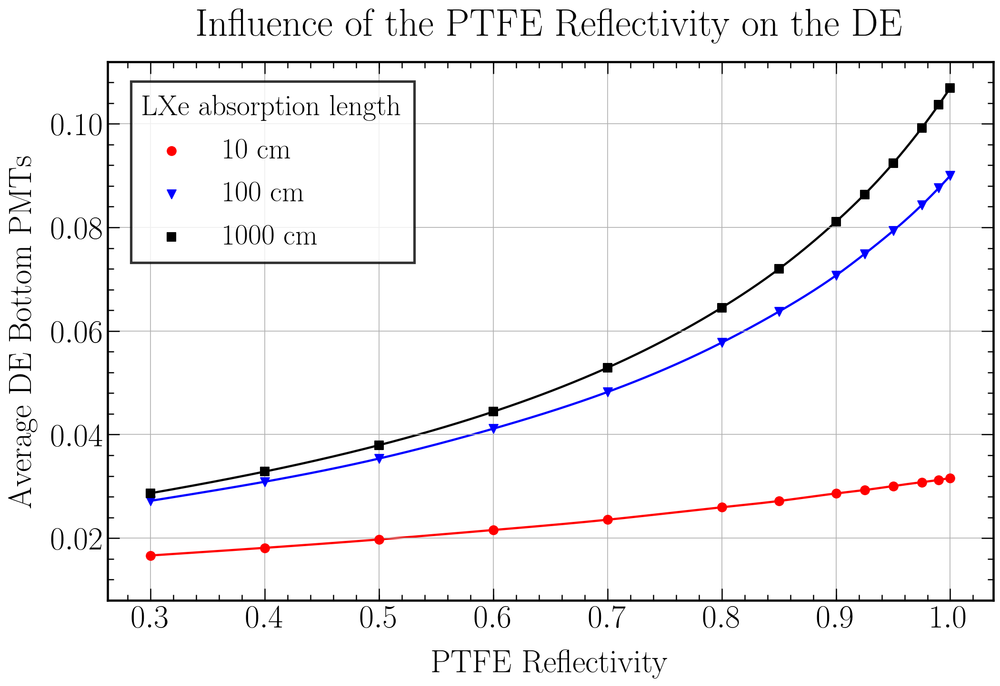

In [15]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE Bottom PMTs', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the DE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="LXe absorption length", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.02,0.104)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_DE_Bottom_spline.png")
plt.show()

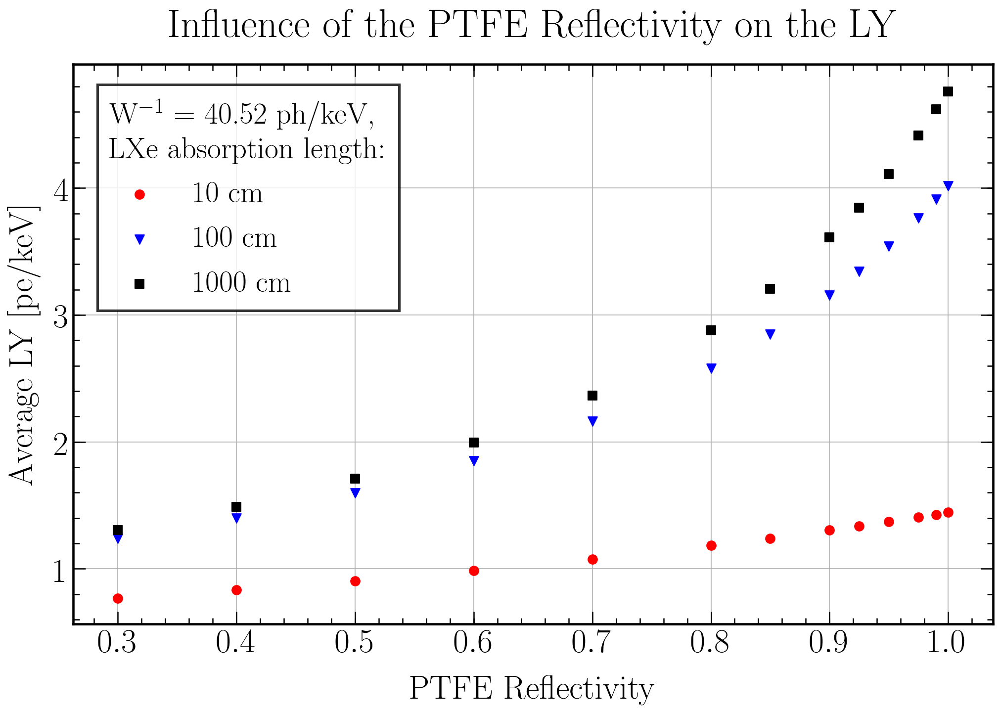

In [16]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"LXe absorption length:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.02,0.104)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_LY.png")
plt.show()

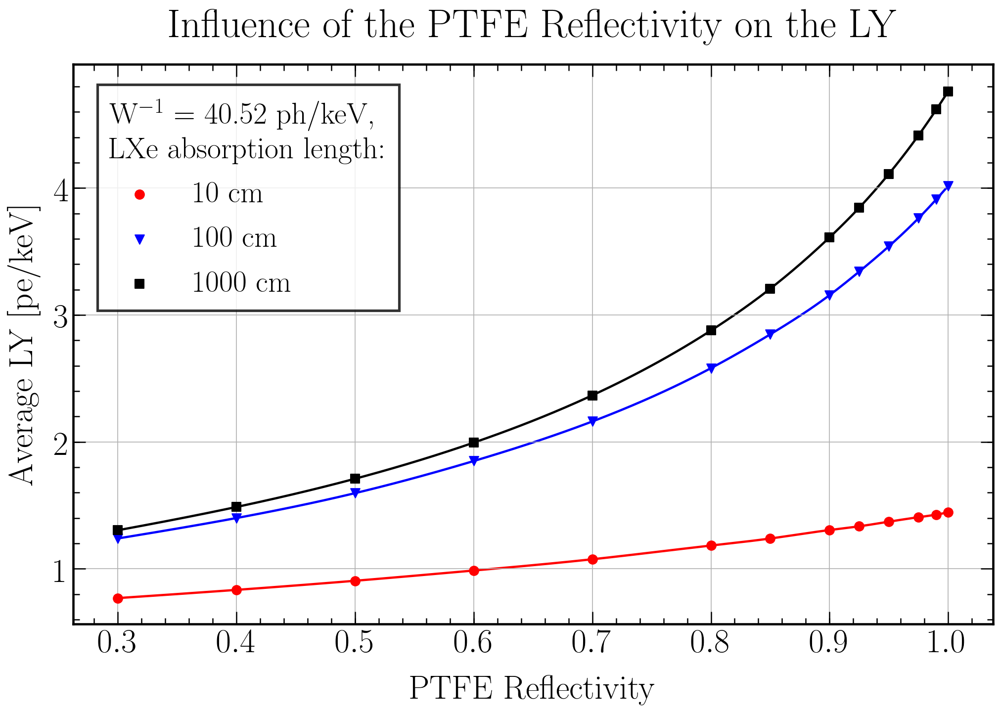

In [17]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"LXe absorption length:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.02,0.104)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_LY_spline.png")
plt.show()

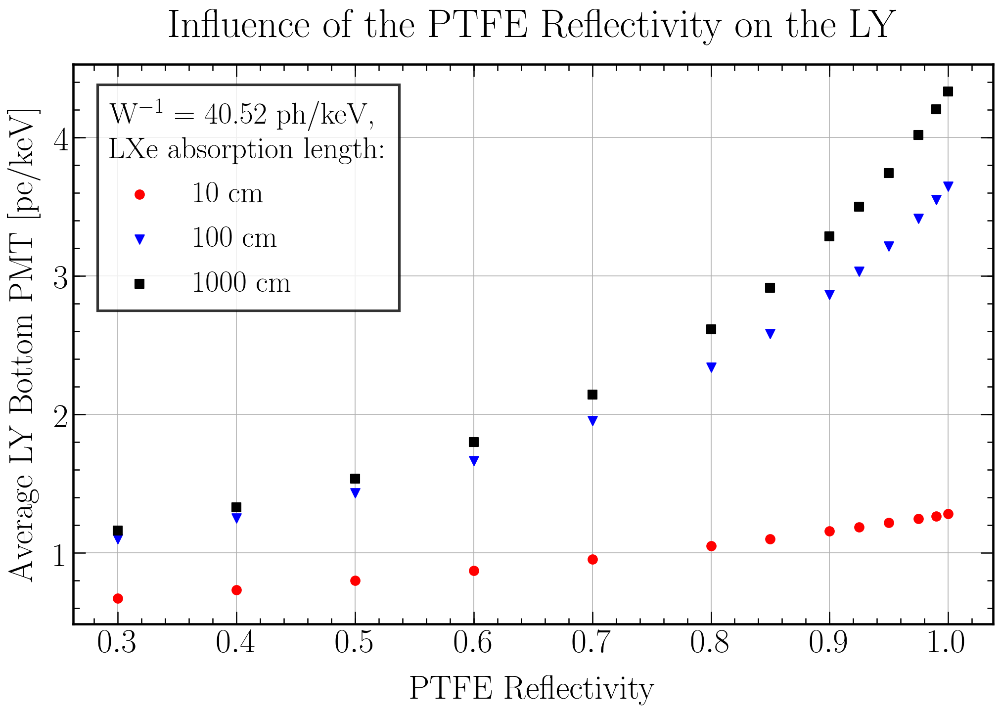

In [18]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"LXe absorption length:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.02,0.104)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_LY_Bottom.png")
plt.show()

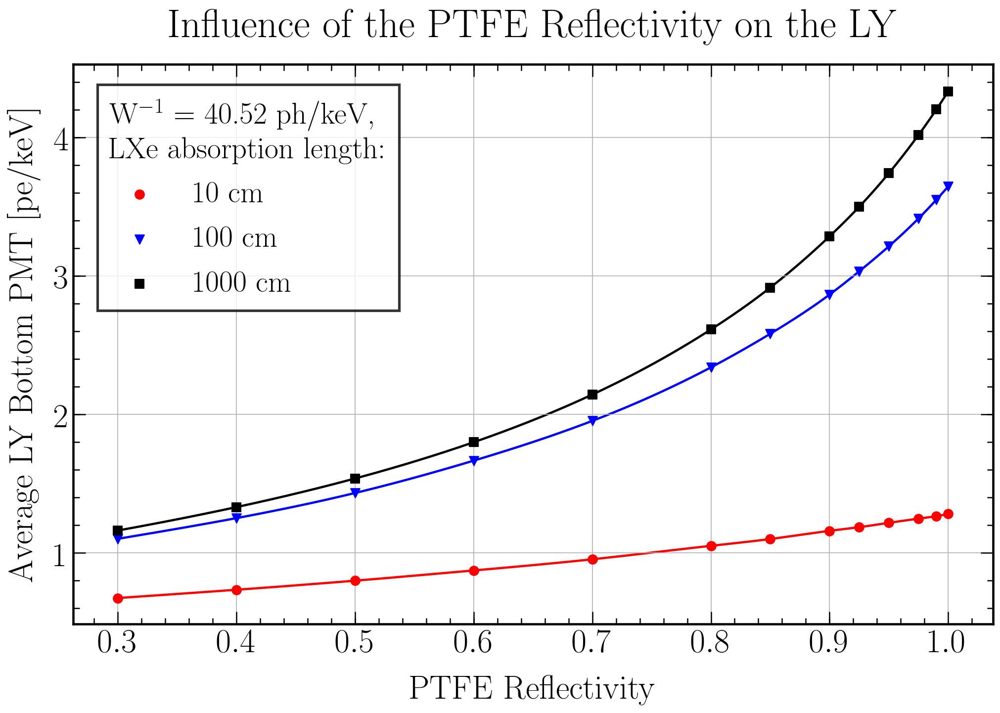

In [19]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"LXe absorption length:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.02,0.104)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_LY_Bottom_spline.png")
plt.show()

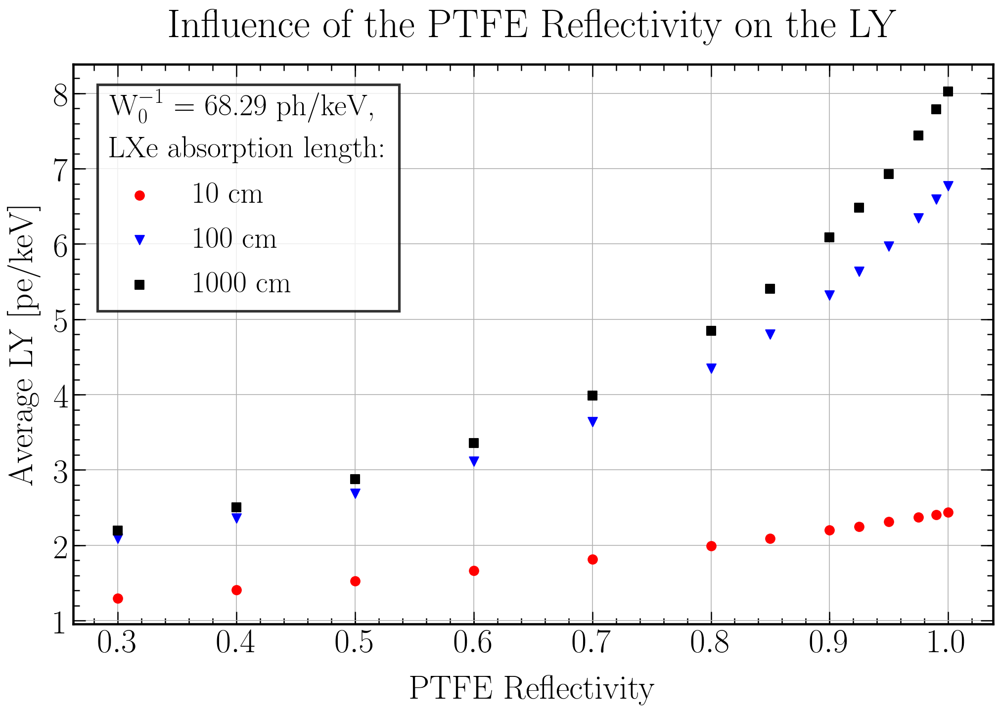

In [20]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\n"+"LXe absorption length:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.02,0.104)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_LY0.png")
plt.show()

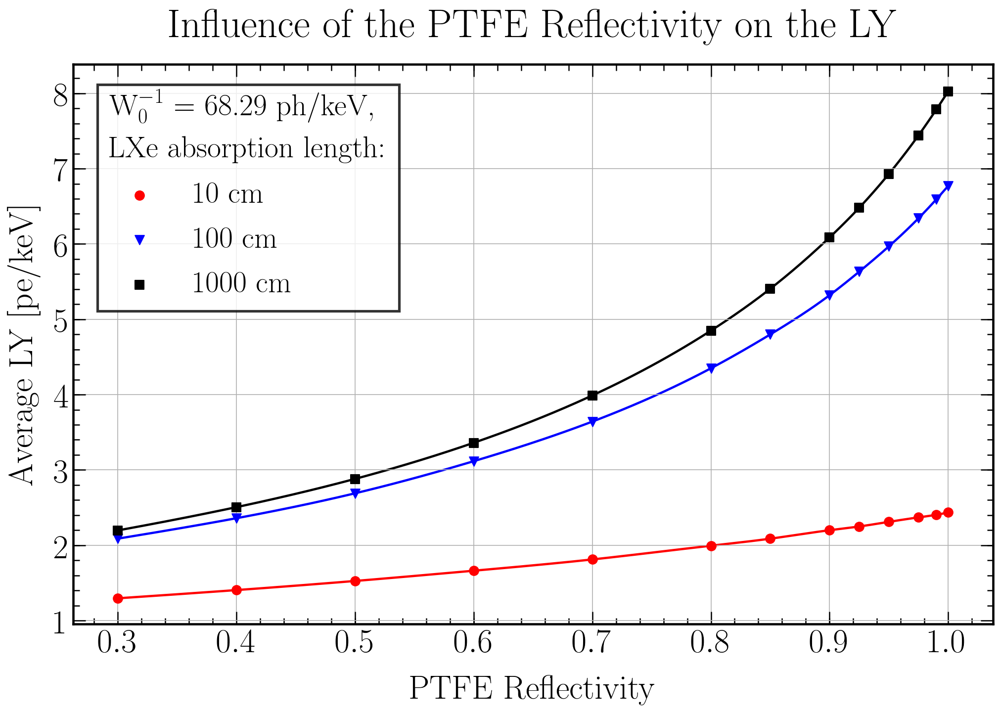

In [21]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\n"+"LXe absorption length:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.02,0.104)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_LY0_spline.png")
plt.show()

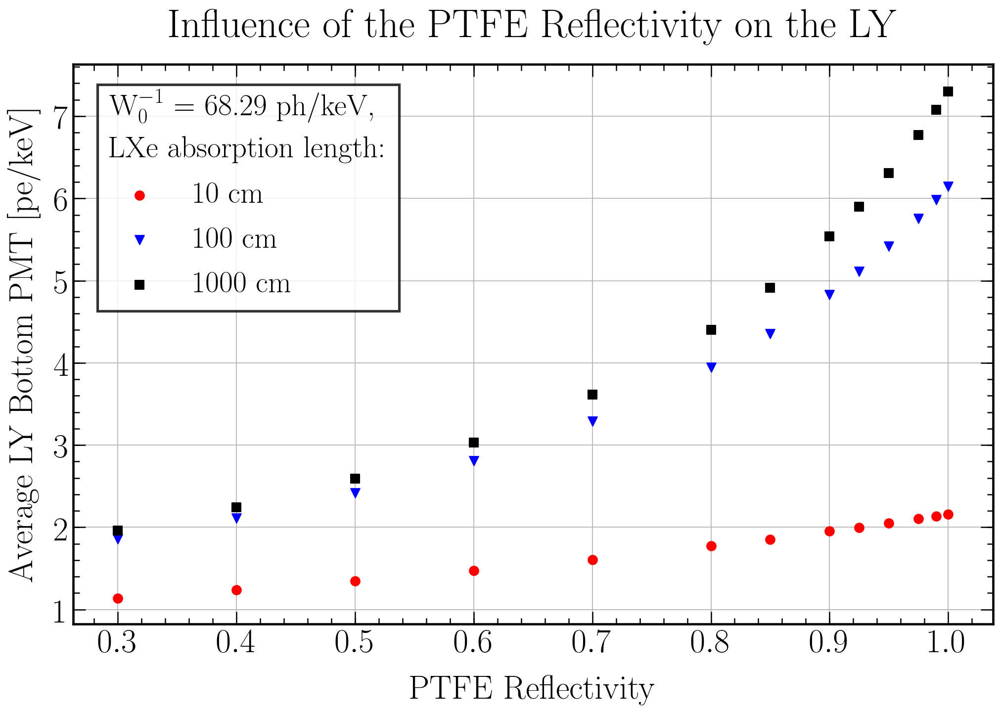

In [22]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\n"+"LXe absorption length:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.02,0.104)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_LY0_Bottom.png")
plt.show()

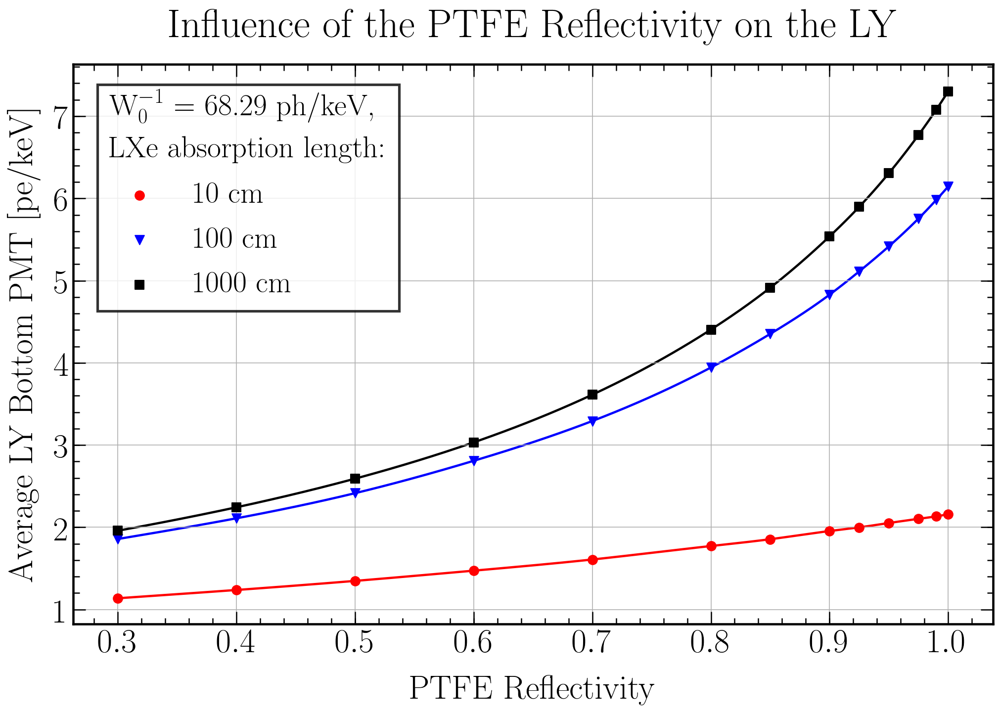

In [23]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["RPTFE"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["LXeAbs"] == 10) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = "  10 cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["LXeAbs"] == 100) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 100 cm", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["RPTFE"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["LXeAbs"] == 1000) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 1000 cm", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('PTFE Reflectivity', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the PTFE Reflectivity on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\n"+"LXe absorption length:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(0,100)
#plt.ylim(0.02,0.104)
#plt.xlim(left=0)
#plt.yscale('log', nonposy='clip')

fig.savefig("Influence_TeflonRef_LY0_Bottom_spline.png")
plt.show()

## Influence of the LXe Absorption Length on the LCE

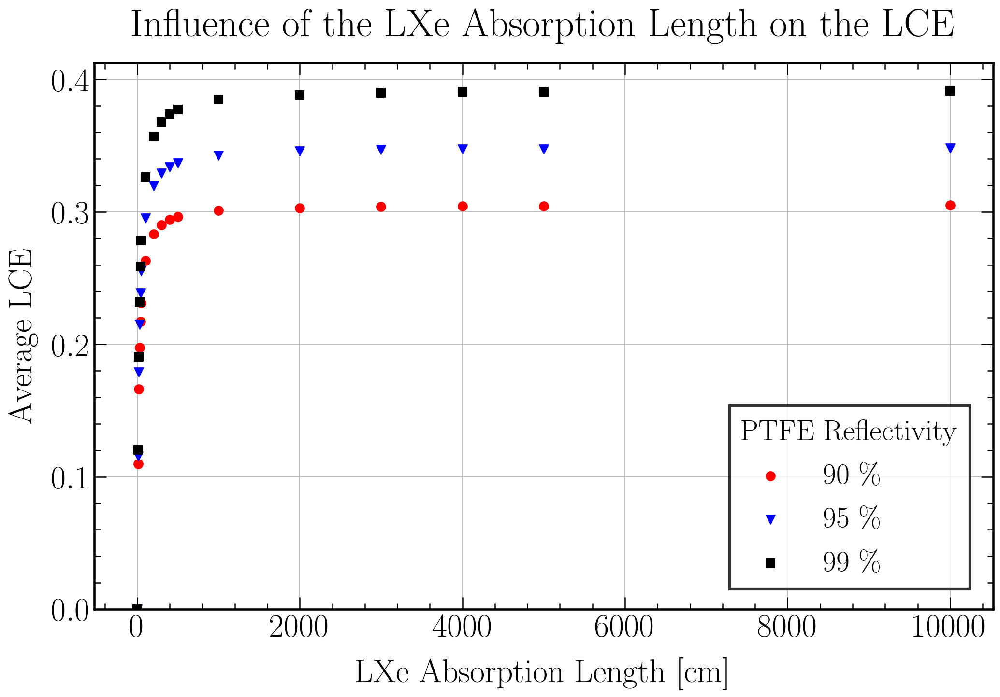

In [24]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LCE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LCE.png")
plt.show()

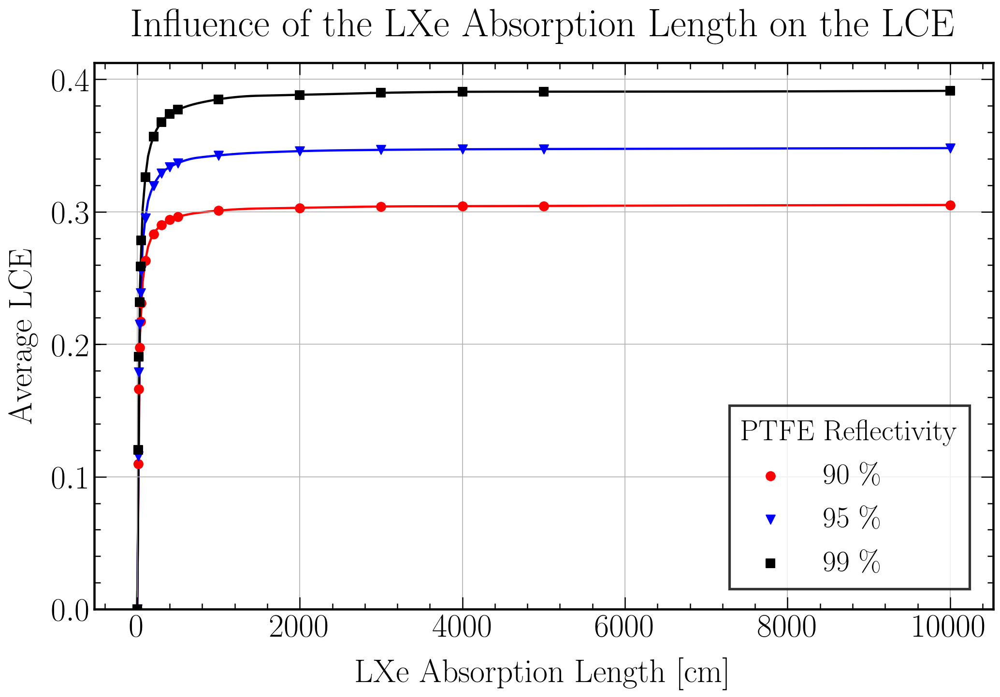

In [25]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LCE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LCE_spline.png")
plt.show()

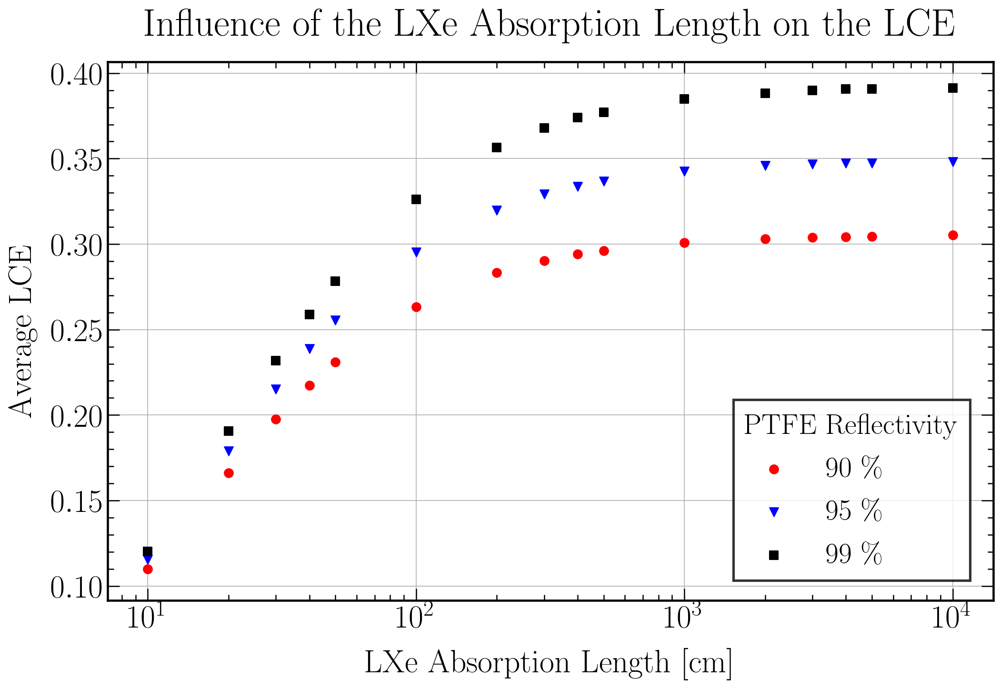

In [26]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LCE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LCE_log.png")
plt.show()

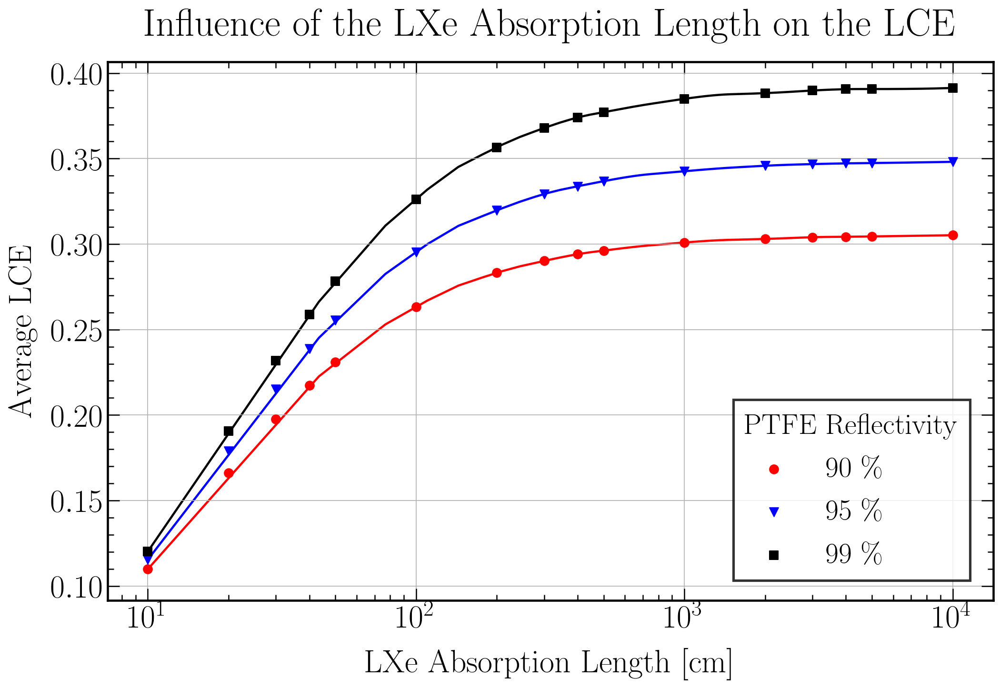

In [27]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LCE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LCE_log_spline.png")
plt.show()

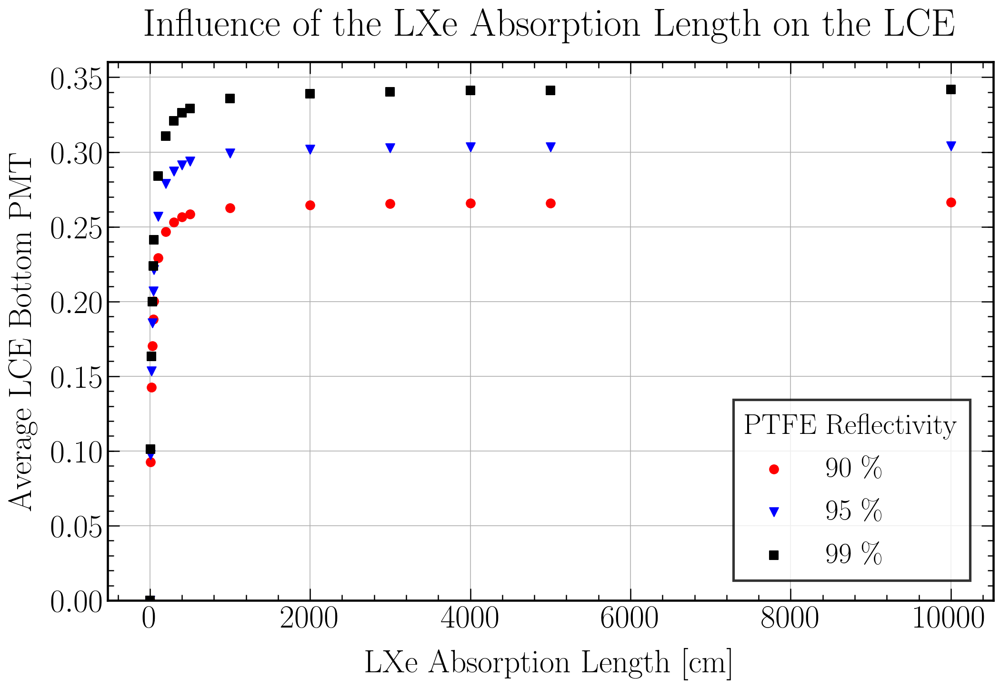

In [28]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LCE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LCE_Bottom.png")
plt.show()

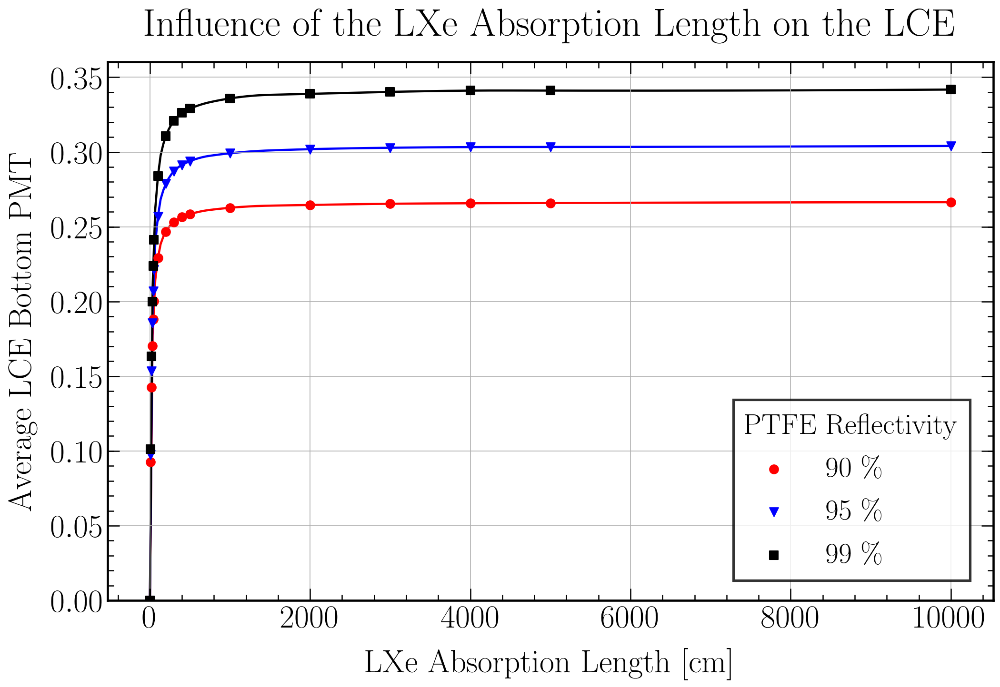

In [29]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LCE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LCE_Bottom_spline.png")
plt.show()

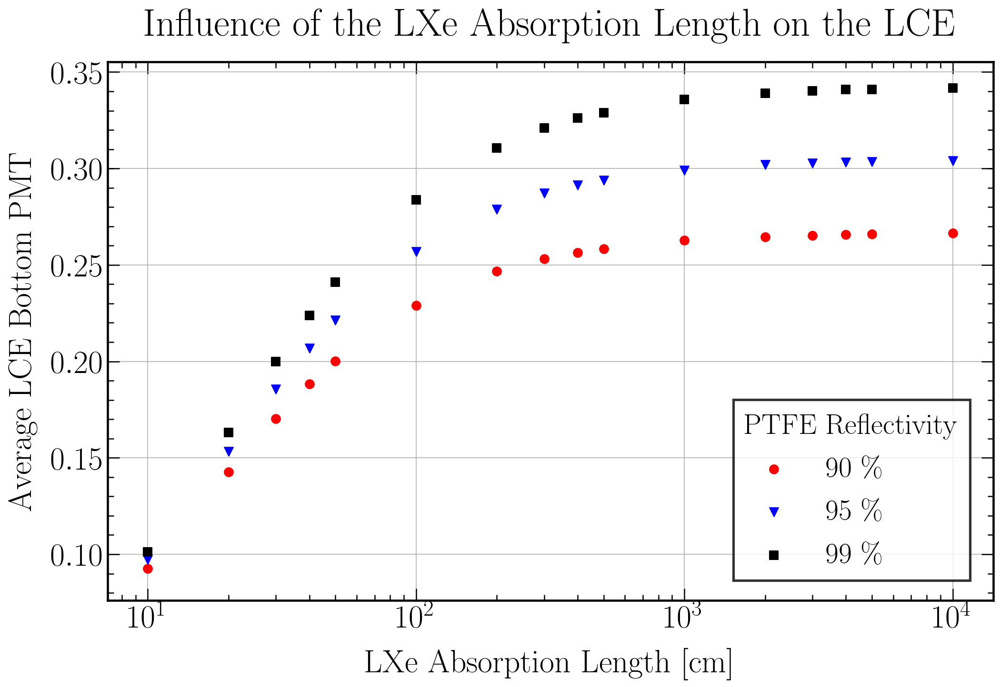

In [30]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LCE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LCE_Bottom_log.png")
plt.show()

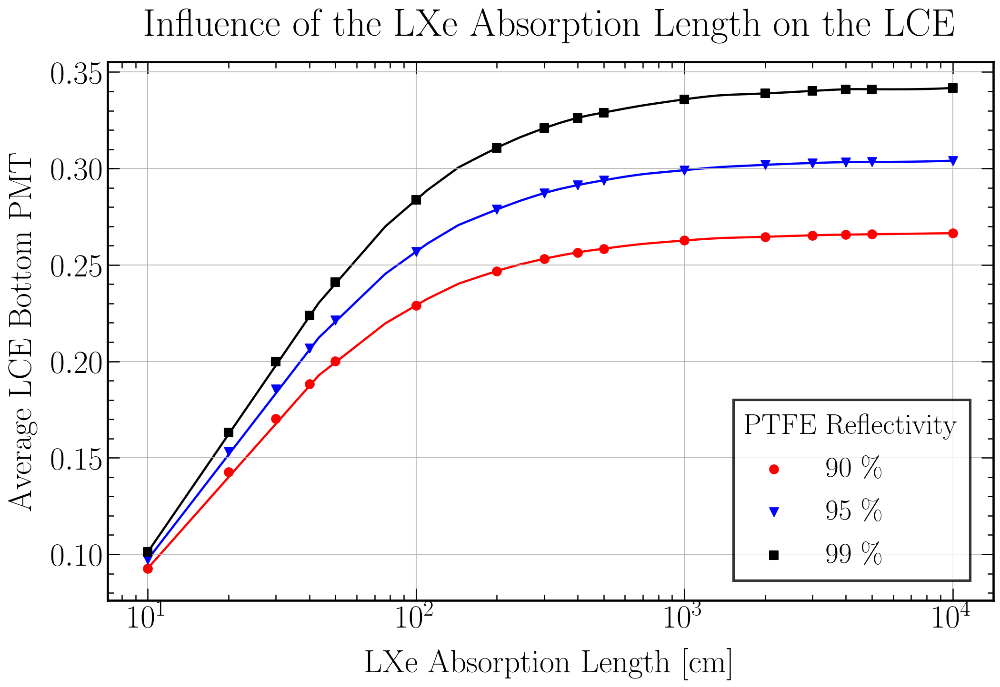

In [31]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LCE_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LCE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LCE_Bottom_log_spline.png")
plt.show()

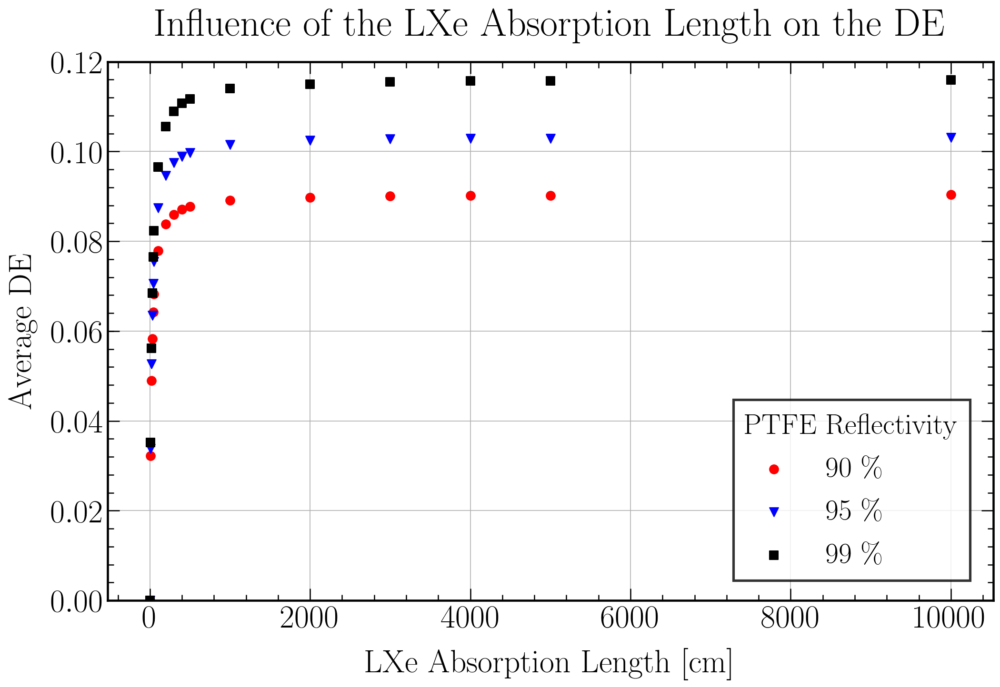

In [32]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the DE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_DE.png")
plt.show()

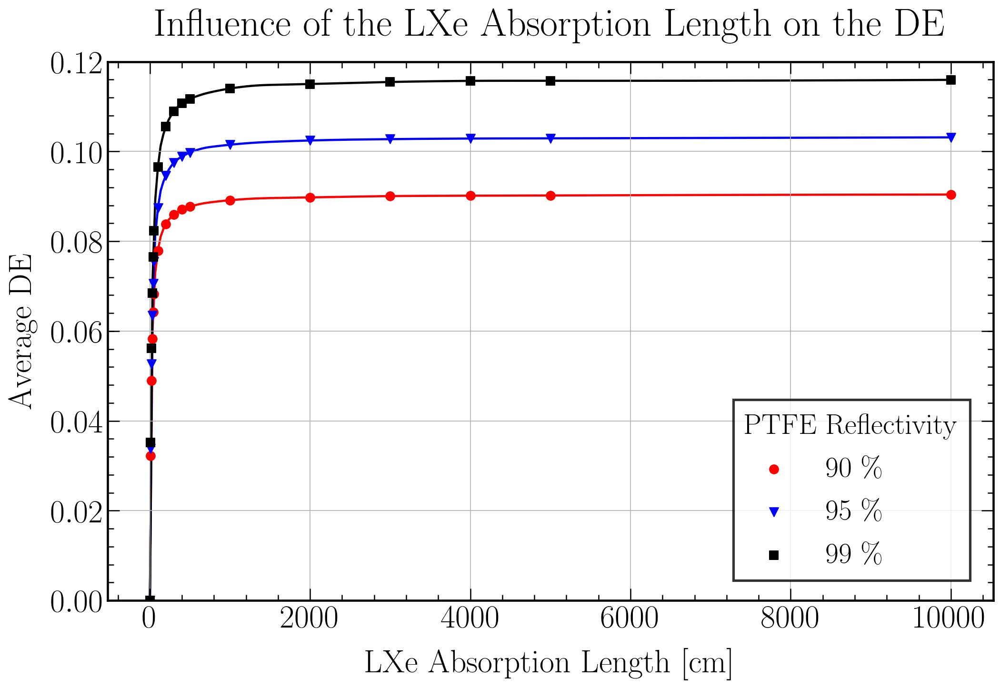

In [33]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the DE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_DE_spline.png")
plt.show()

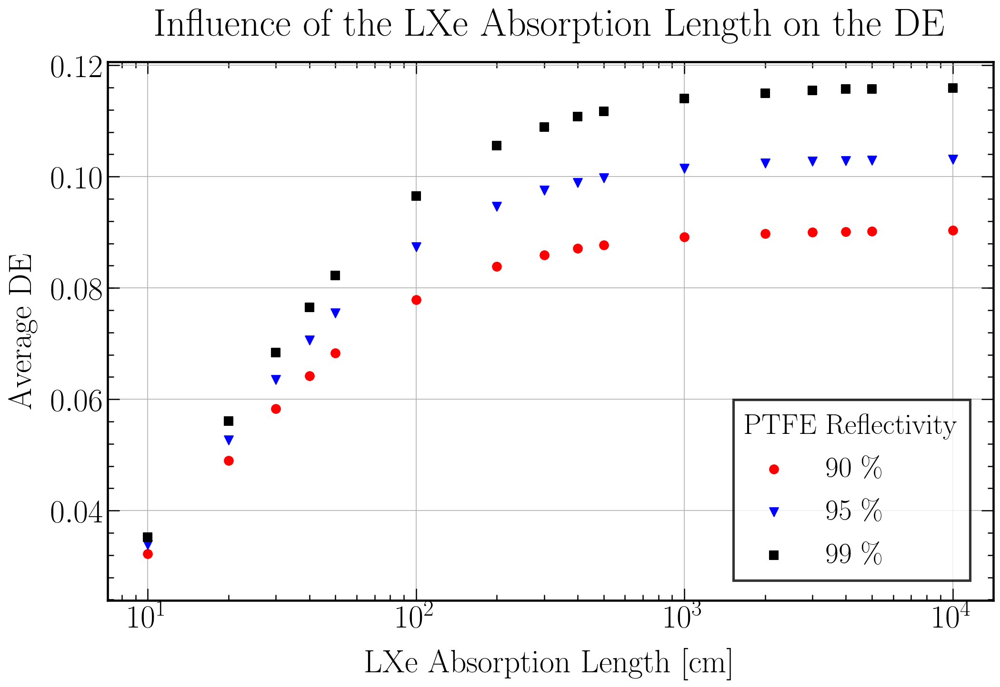

In [34]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the DE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_DE_log.png")
plt.show()

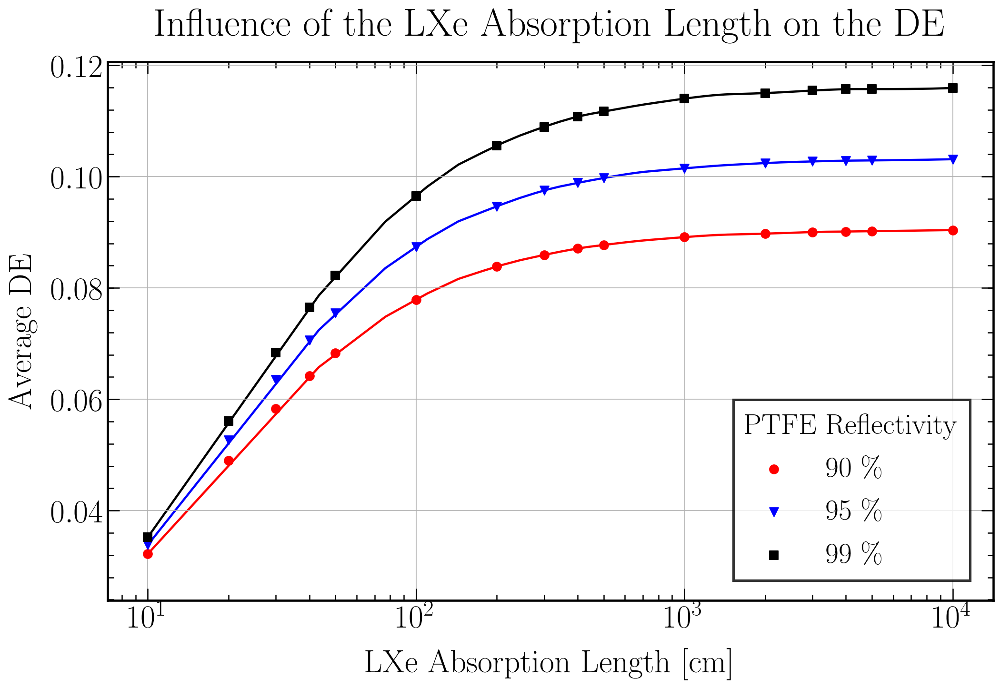

In [35]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the DE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_DE_log_spline.png")
plt.show()

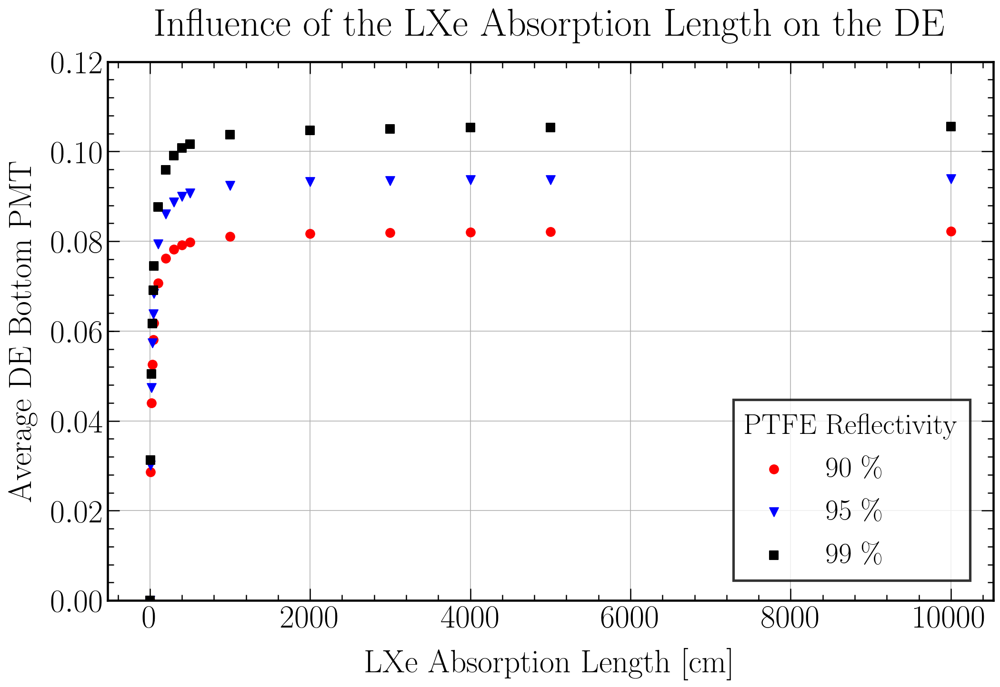

In [36]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the DE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_DE_Bottom.png")
plt.show()

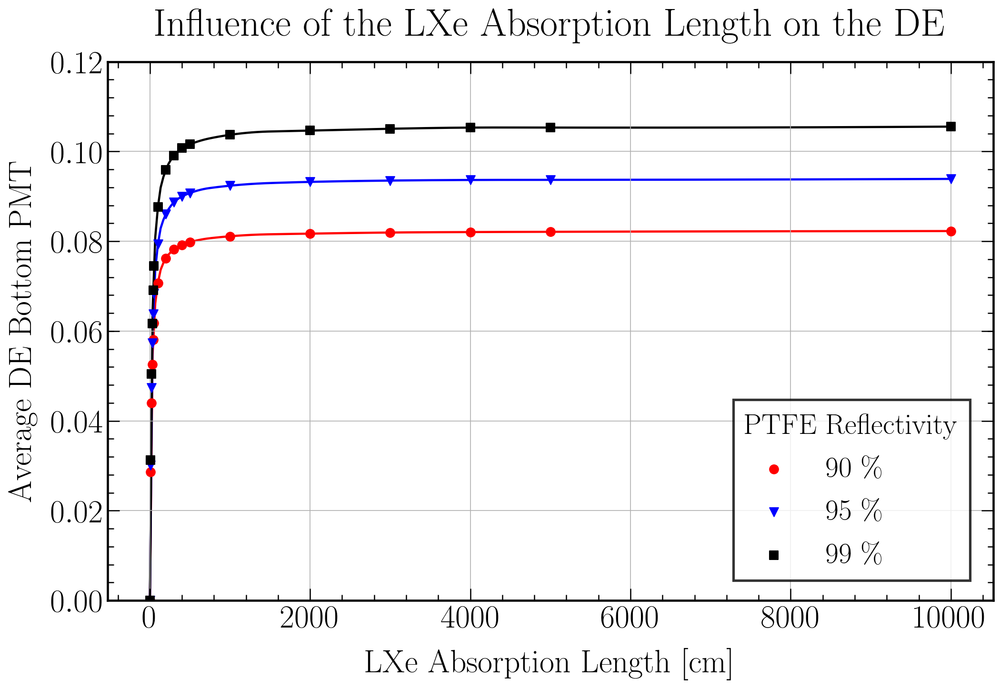

In [37]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the DE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_DE_Bottom_spline.png")
plt.show()

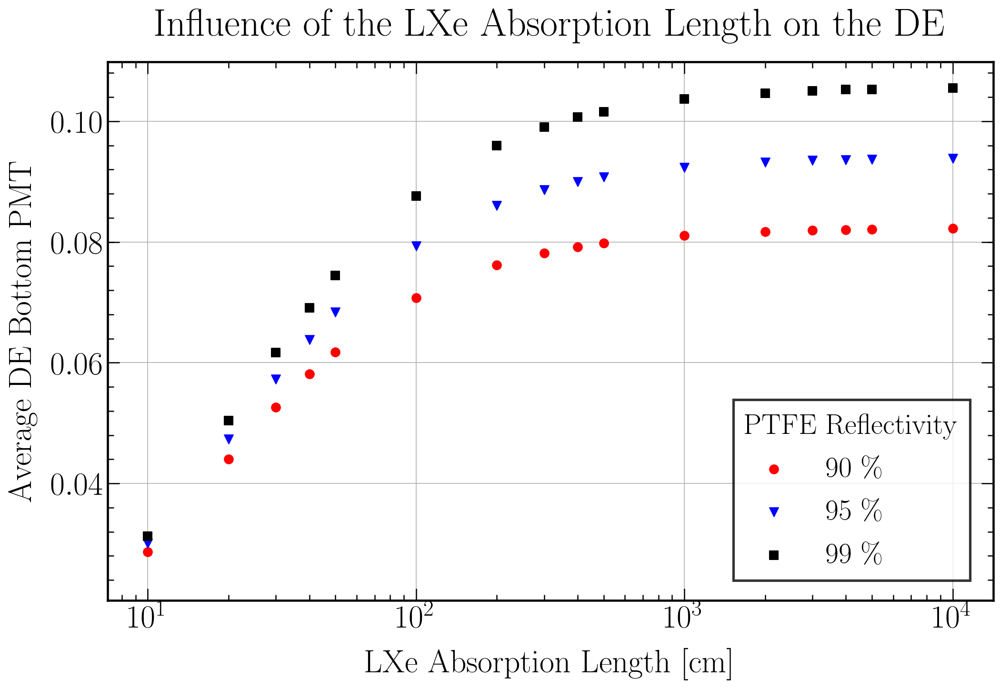

In [38]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the DE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_DE_Bottom_log.png")
plt.show()

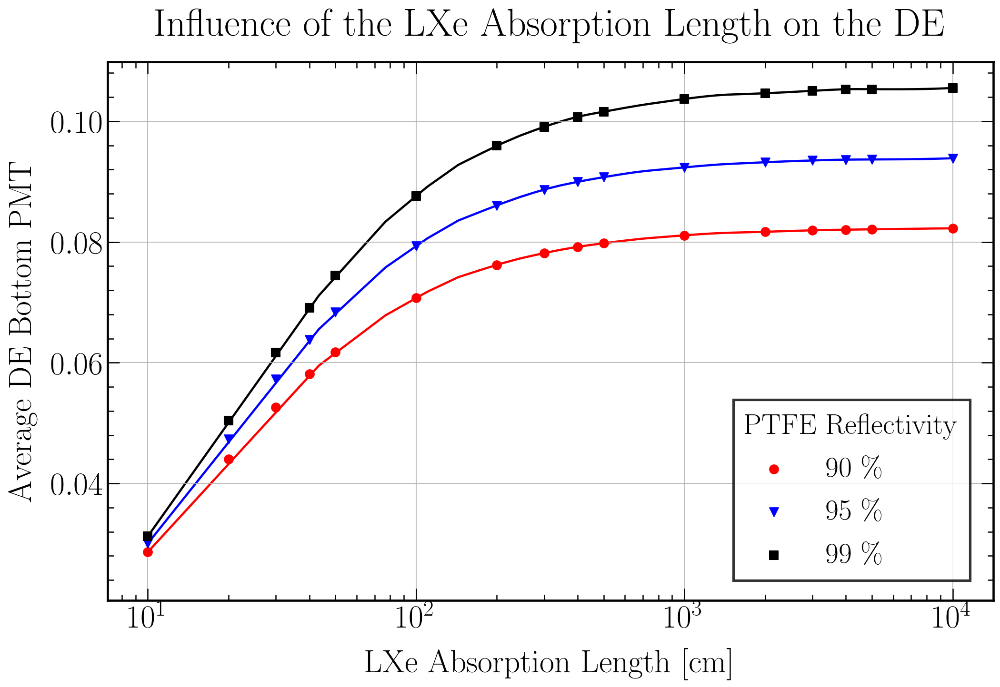

In [39]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["DE_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the DE', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="PTFE Reflectivity", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_DE_Bottom_log_spline.png")
plt.show()

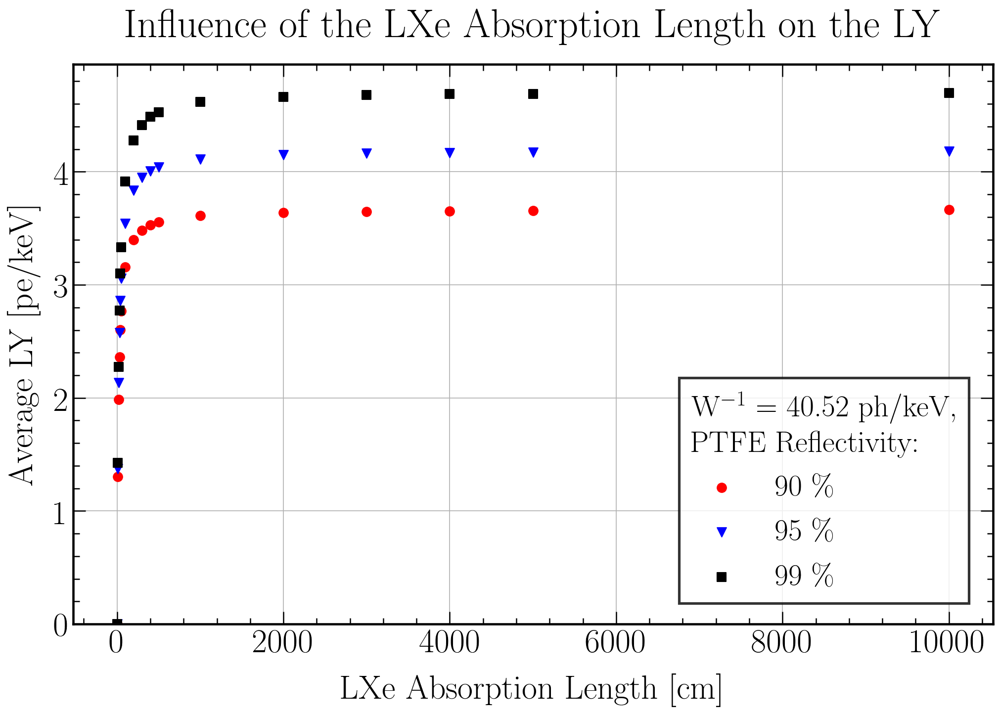

In [40]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY.png")
plt.show()

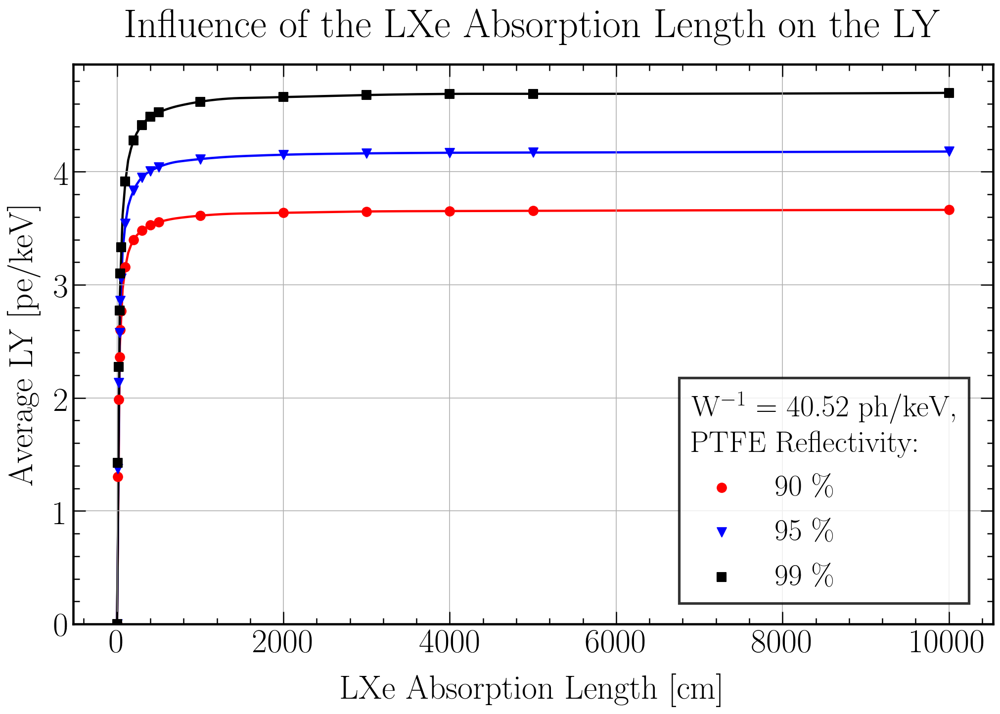

In [41]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY_spline.png")
plt.show()

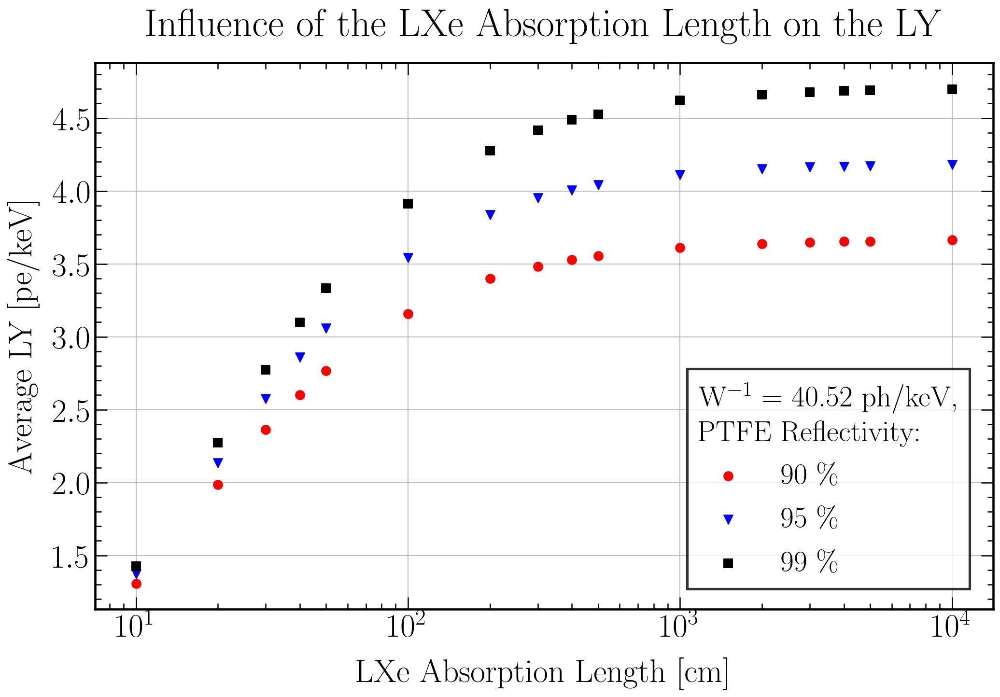

In [42]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY_log.png")
plt.show()

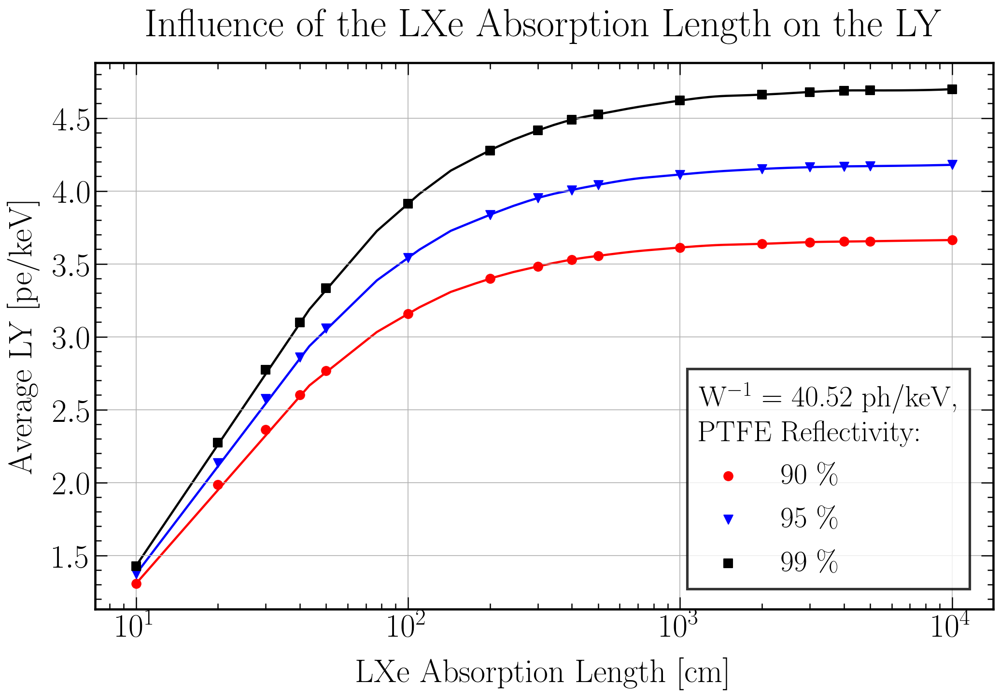

In [43]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY_log_spline.png")
plt.show()

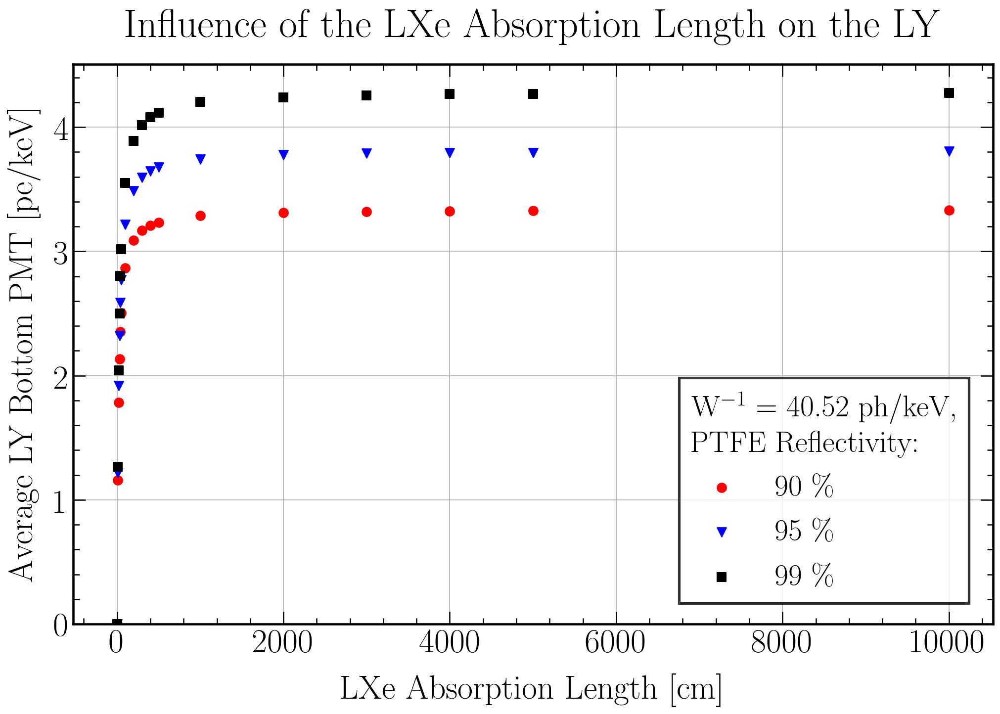

In [44]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY_Bottom.png")
plt.show()

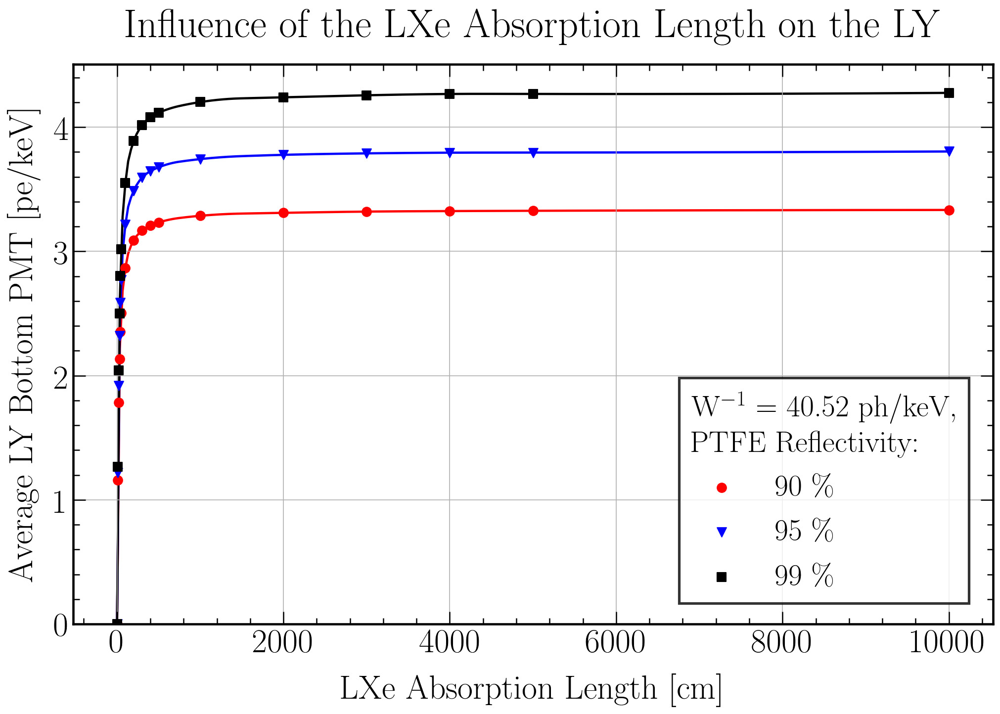

In [45]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY_Bottom_spline.png")
plt.show()

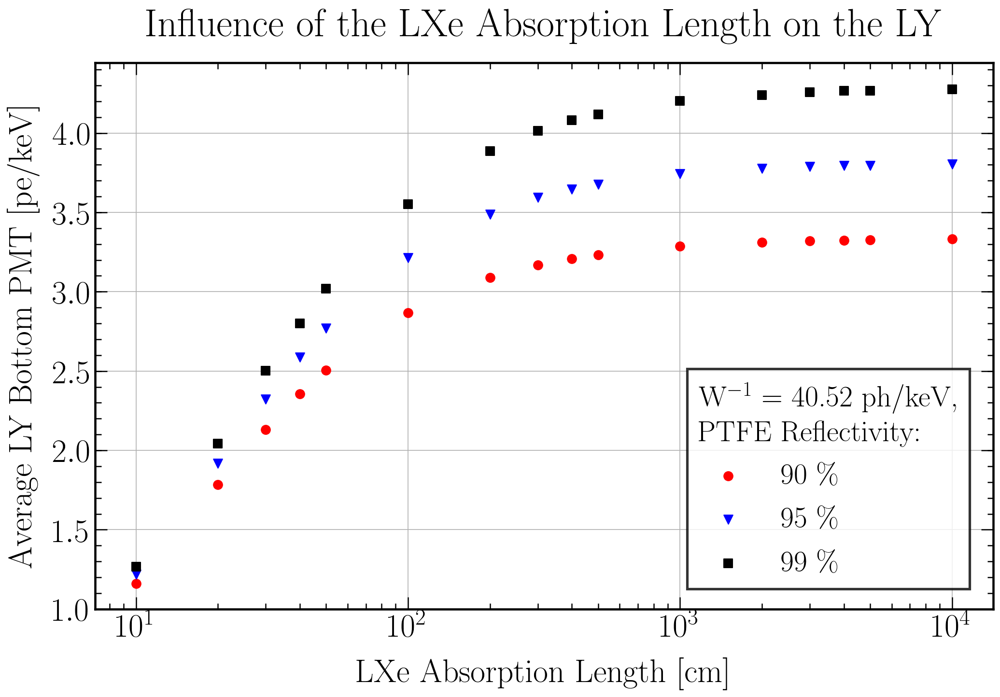

In [46]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY_Bottom_log.png")
plt.show()

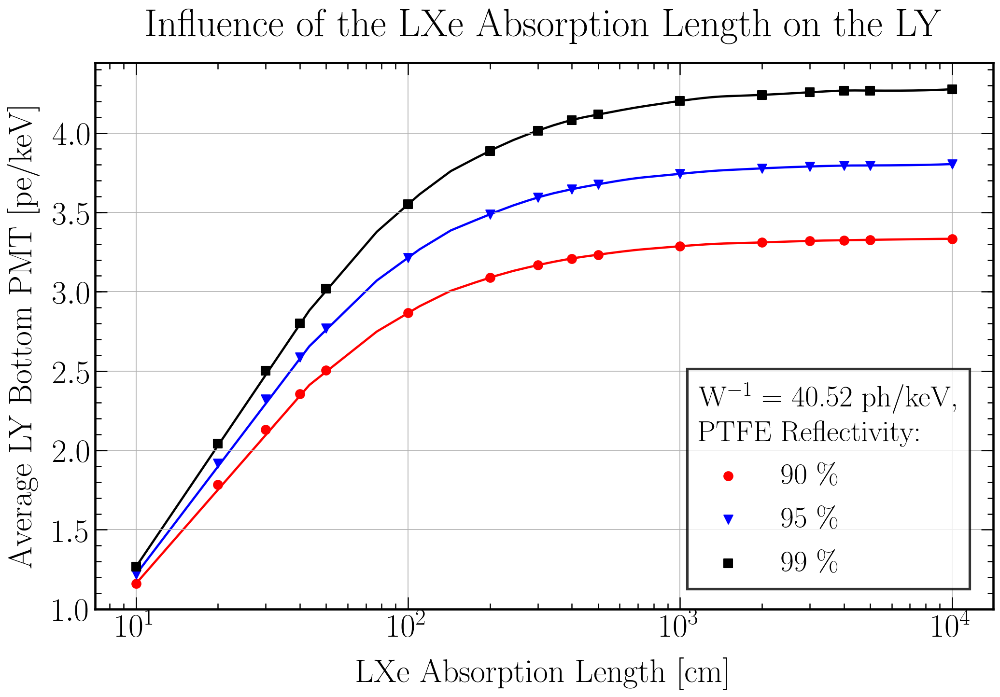

In [47]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY_Bottom_log_spline.png")
plt.show()

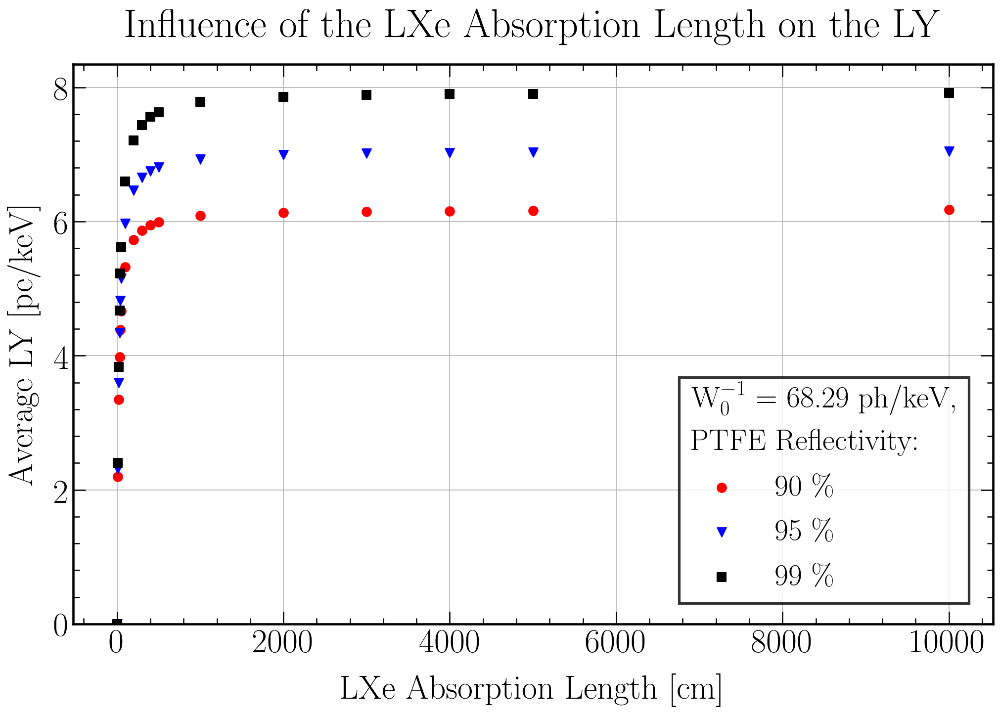

In [48]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY0.png")
plt.show()

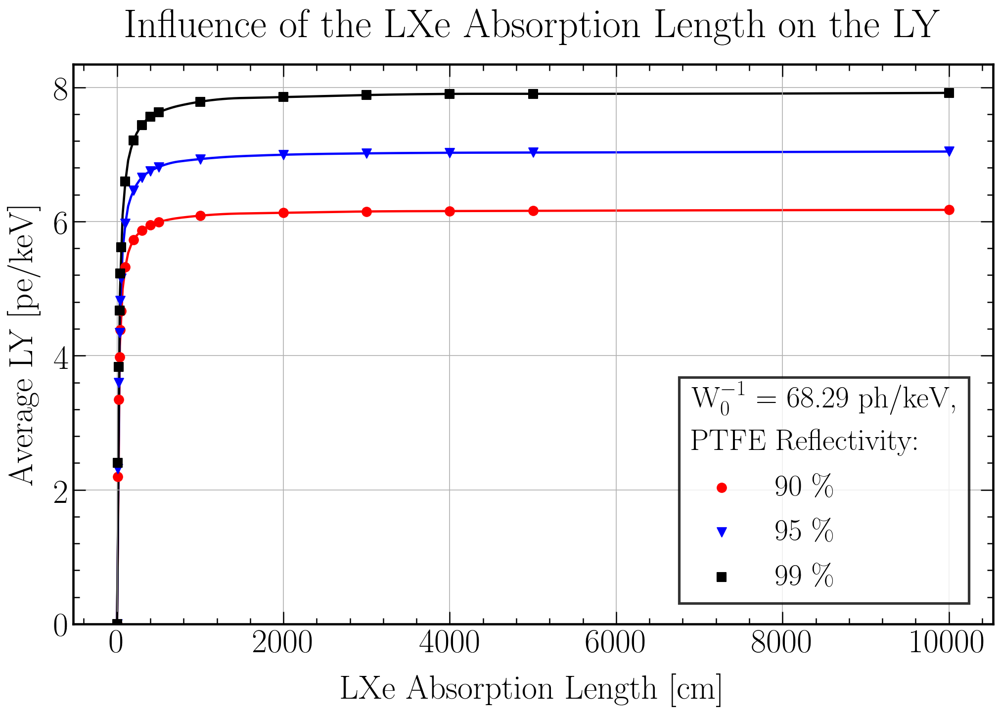

In [49]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY0_spline.png")
plt.show()

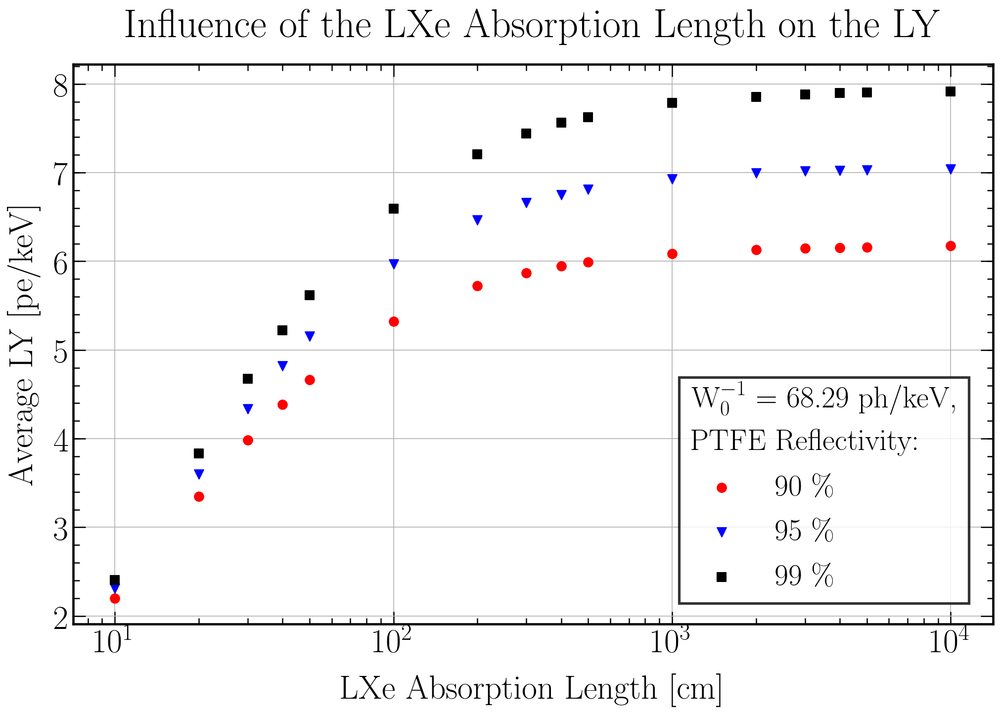

In [50]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY0_log.png")
plt.show()

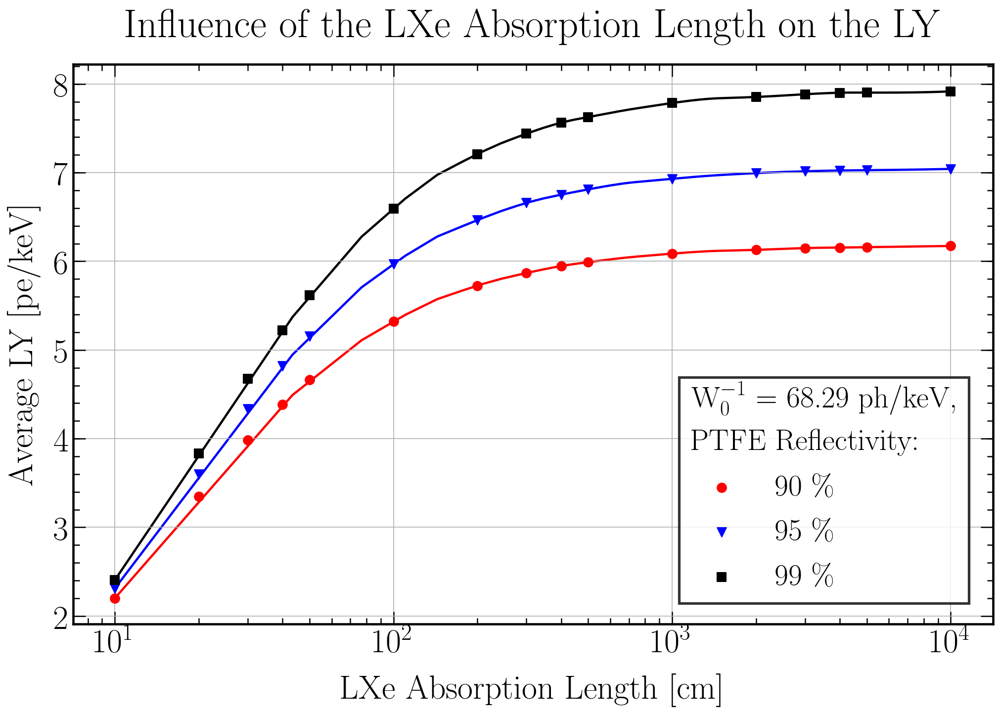

In [51]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_a"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY0_log_spline.png")
plt.show()

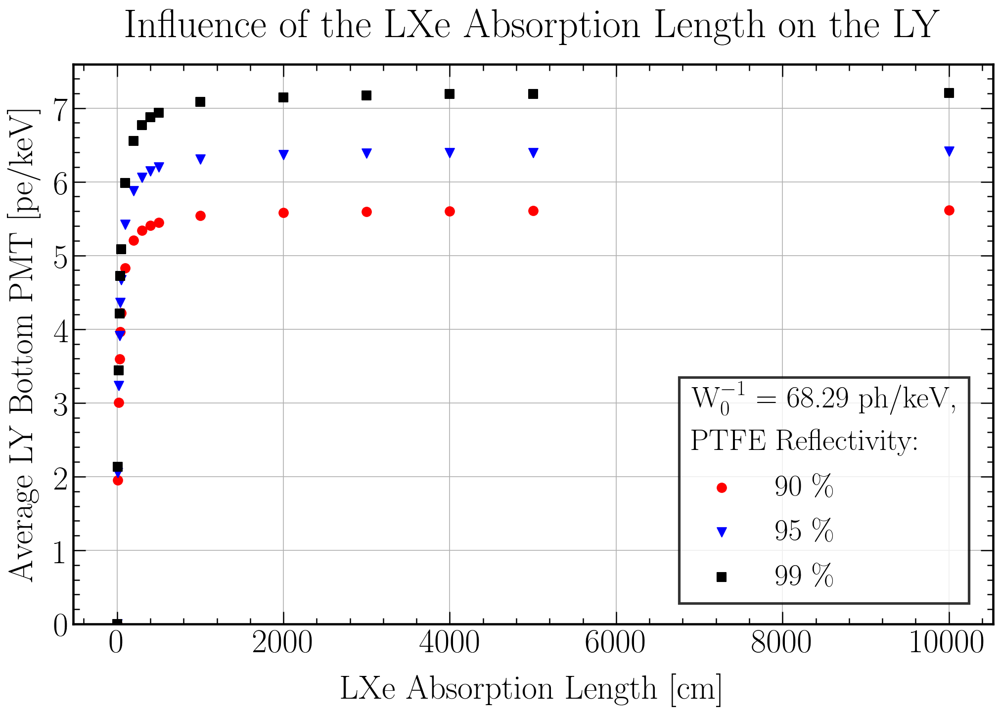

In [52]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY0_Bottom.png")
plt.show()

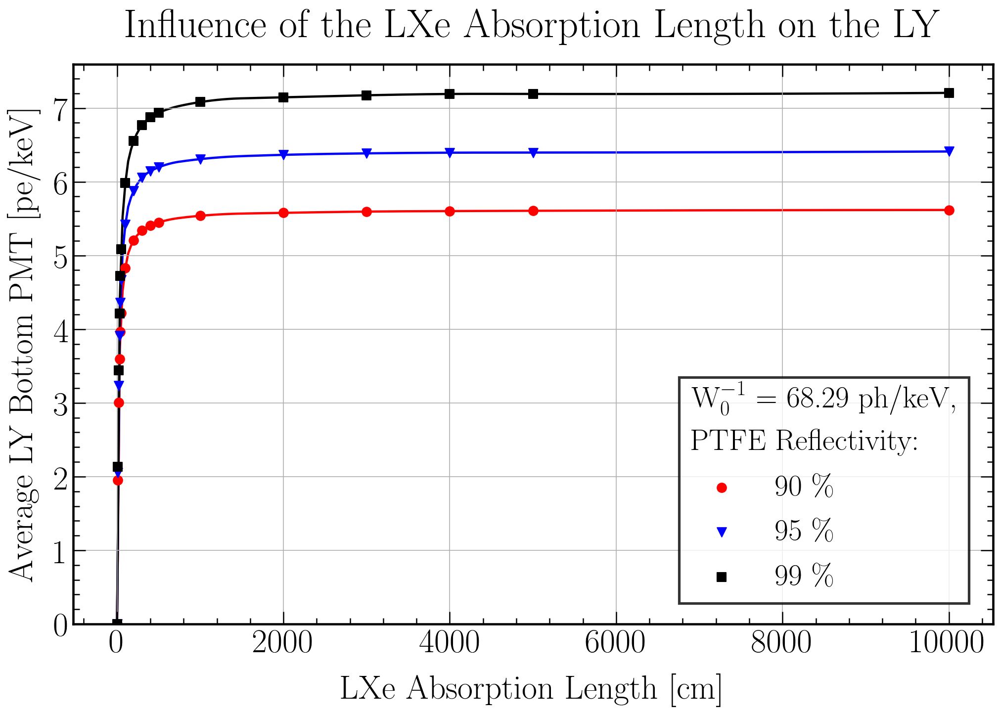

In [53]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY0_Bottom_spline.png")
plt.show()

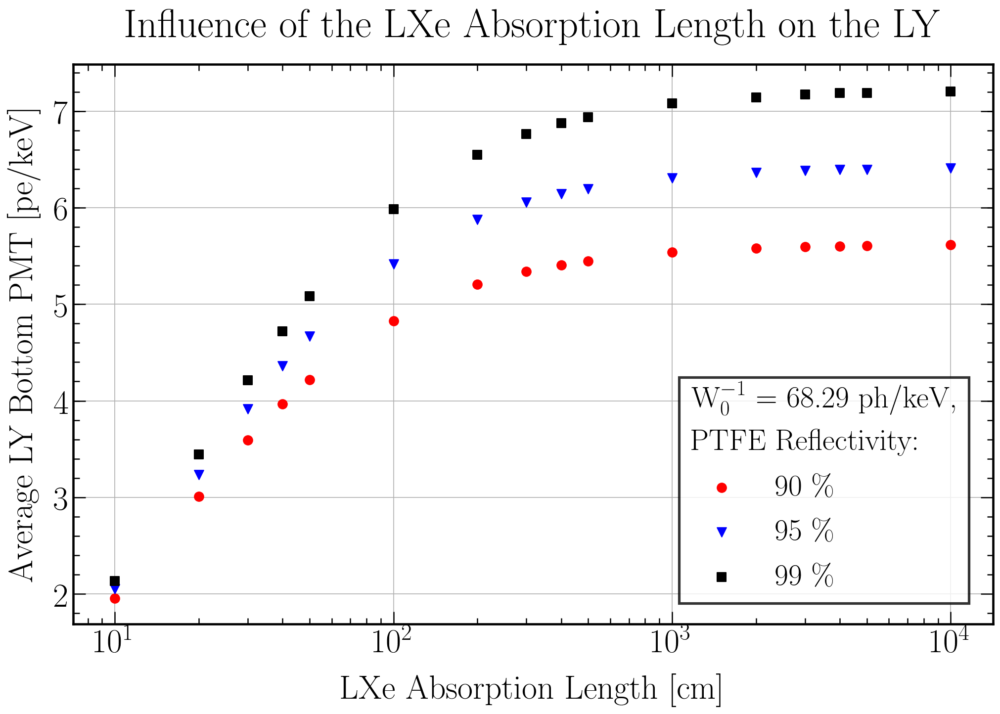

In [54]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY0_Bottom_log.png")
plt.show()

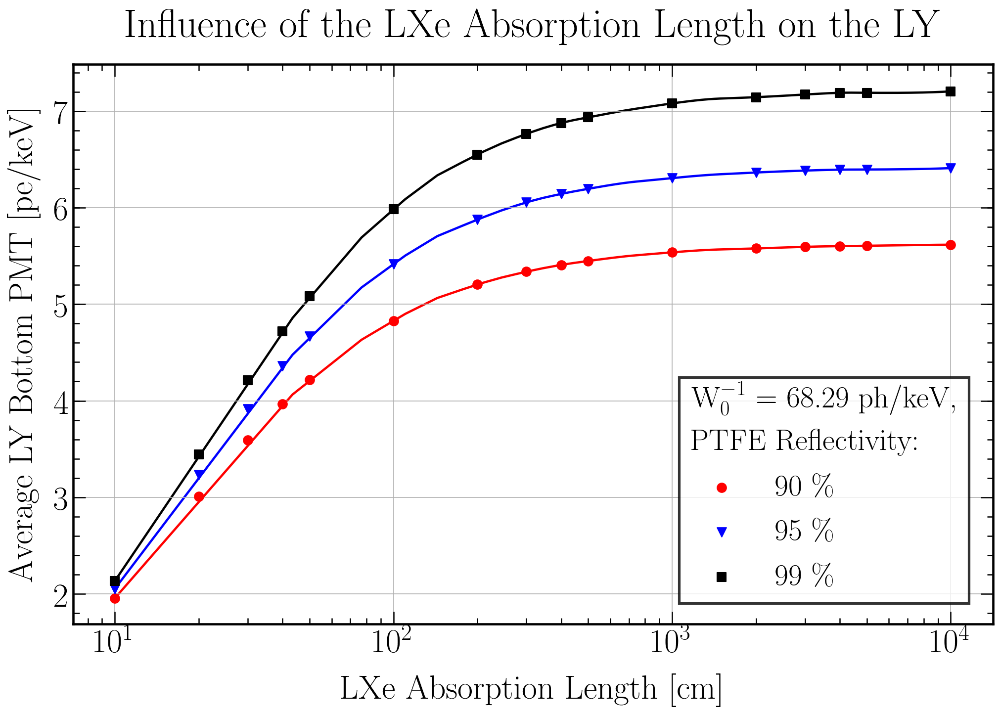

In [55]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.90) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 90 $\%$", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.95) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 95 $\%$", color = "blue", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["LXeAbs"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
y = opticals["LY0_b"][(opticals["LXeAbs"] > 0) & (opticals["RPTFE"] == 0.99) & (opticals["Tmesh"] == 0.89770509)]
plt.scatter(x,y, label = " 99 $\%$", color = "black", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=2)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('LXe Absorption Length [cm]', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the LXe Absorption Length on the LY', fontsize = title_size, pad = title_pad)

# Legend
leg = plt.legend(loc=4, bbox_to_anchor=(0.99,0.01), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\n"+"PTFE Reflectivity:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.12)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
plt.gca().set_xscale('log')

fig.savefig("Influence_LXeAbsLen_LY0_Bottom_log_spline.png")
plt.show()

## Influence of the Mesh Transparency on the LCE

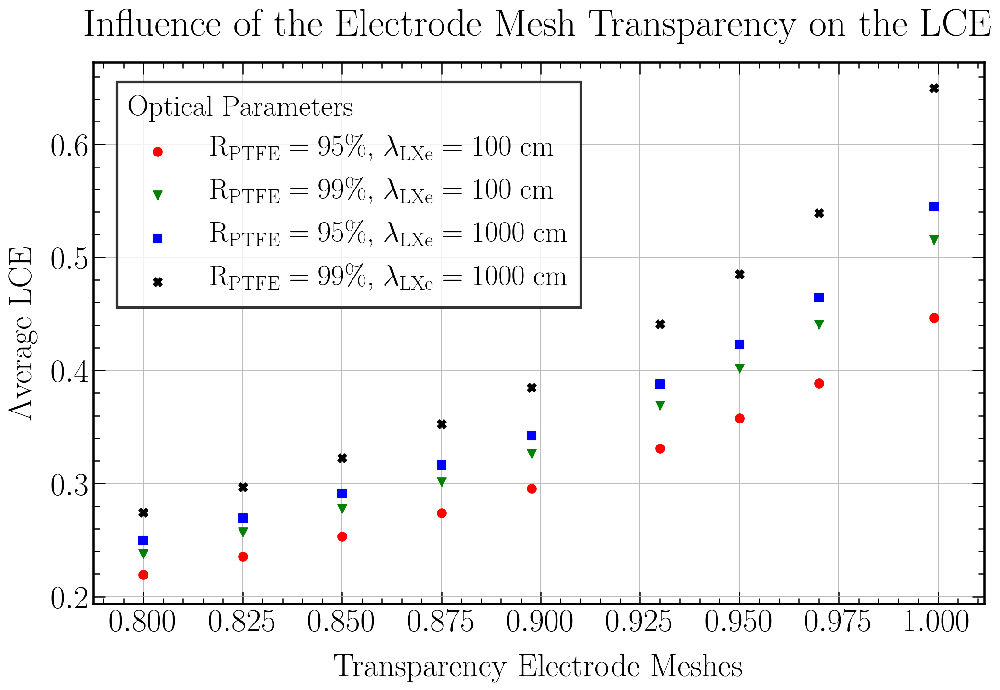

In [56]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the LCE', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="Optical Parameters", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_LCE.png")
plt.show()

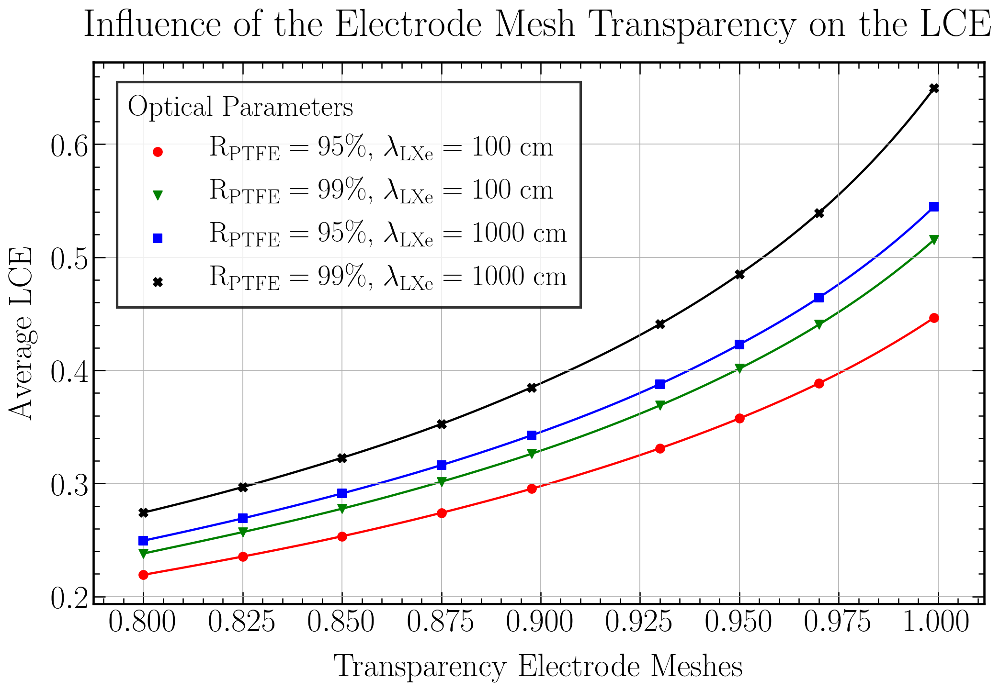

In [57]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'green', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["LCE_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the LCE', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="Optical Parameters", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_LCE_spline.png")
plt.show()

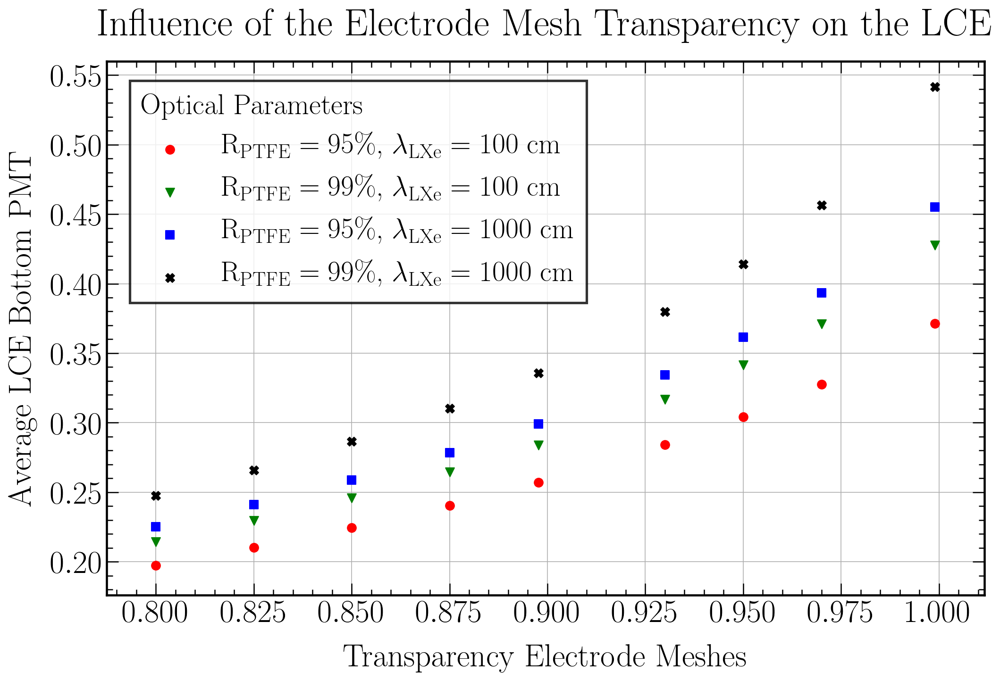

In [58]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the LCE', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="Optical Parameters", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_LCE_Bottom.png")
plt.show()

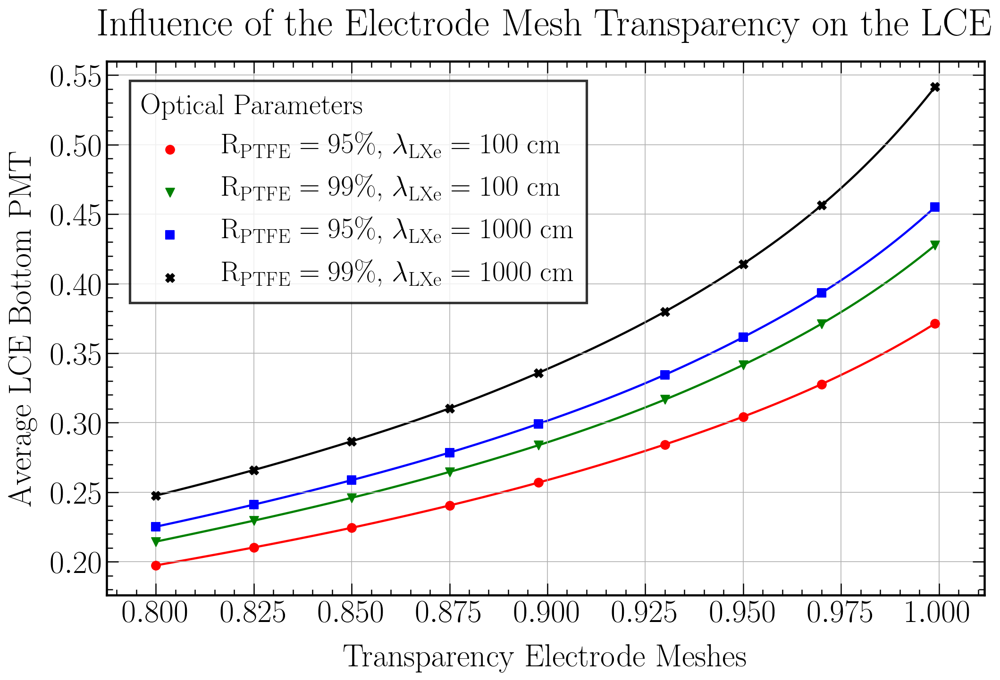

In [59]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'green', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["LCE_b"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LCE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the LCE', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="Optical Parameters", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_LCE_Bottom_spline.png")
plt.show()

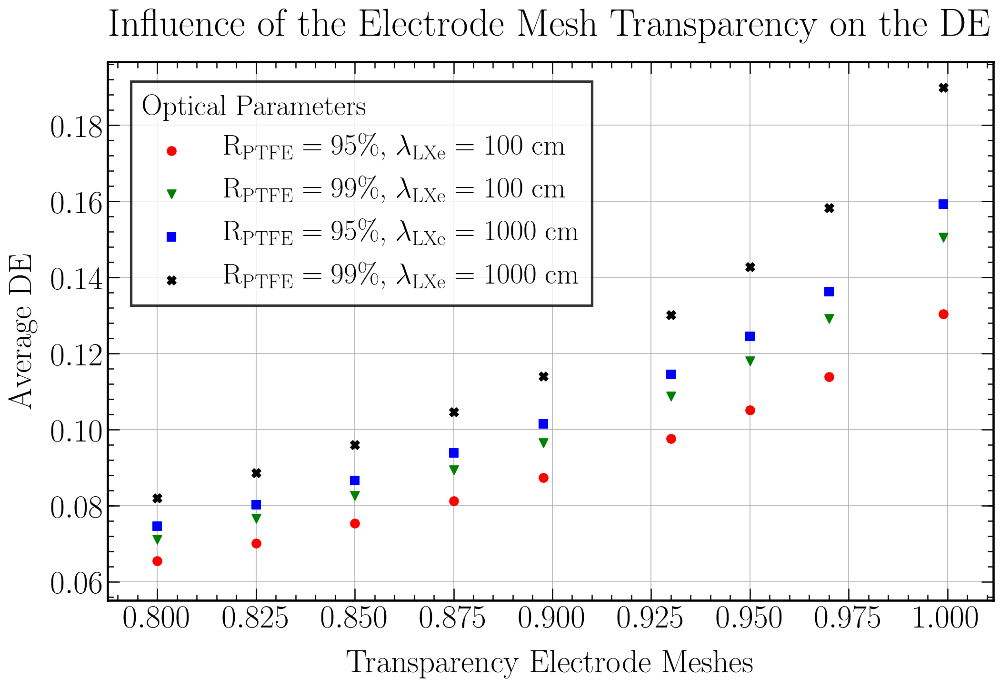

In [60]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the DE', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="Optical Parameters", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_DE.png")
plt.show()

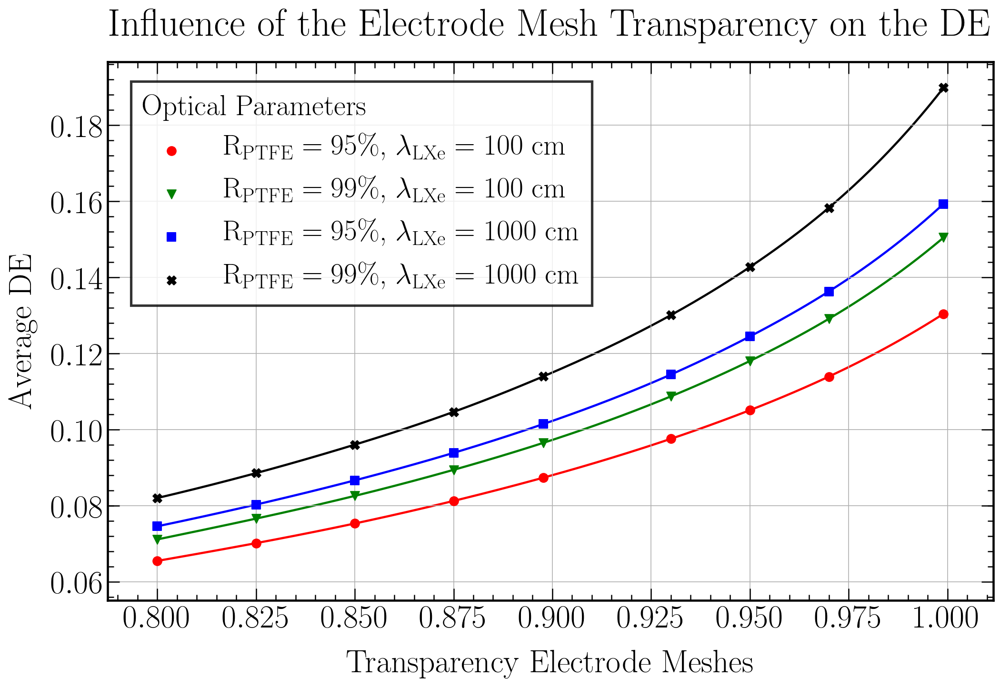

In [61]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'green', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["DE_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the DE', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="Optical Parameters", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_DE_spline.png")
plt.show()

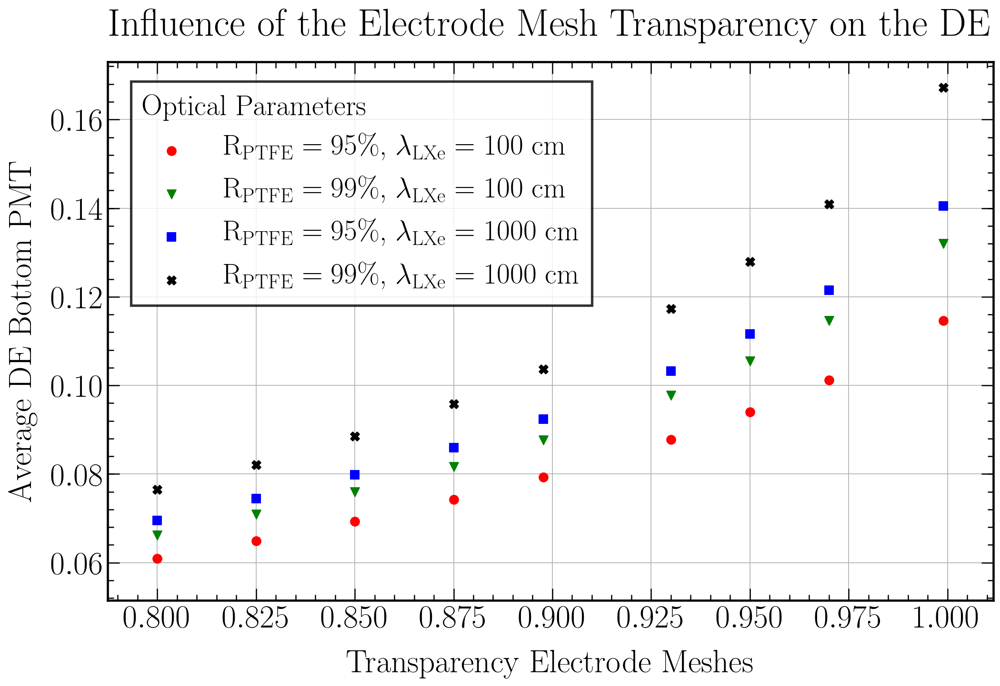

In [62]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the DE', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="Optical Parameters", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_DE_Bottom.png")
plt.show()

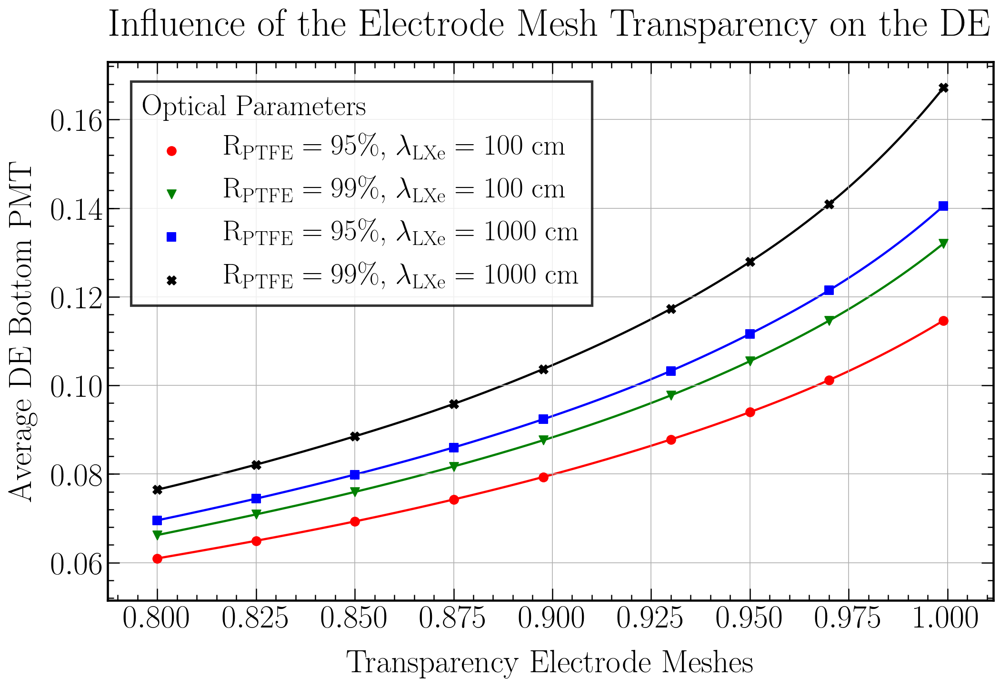

In [63]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'green', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["DE_b"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average DE Bottom PMT', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the DE', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="Optical Parameters", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_DE_Bottom_spline.png")
plt.show()

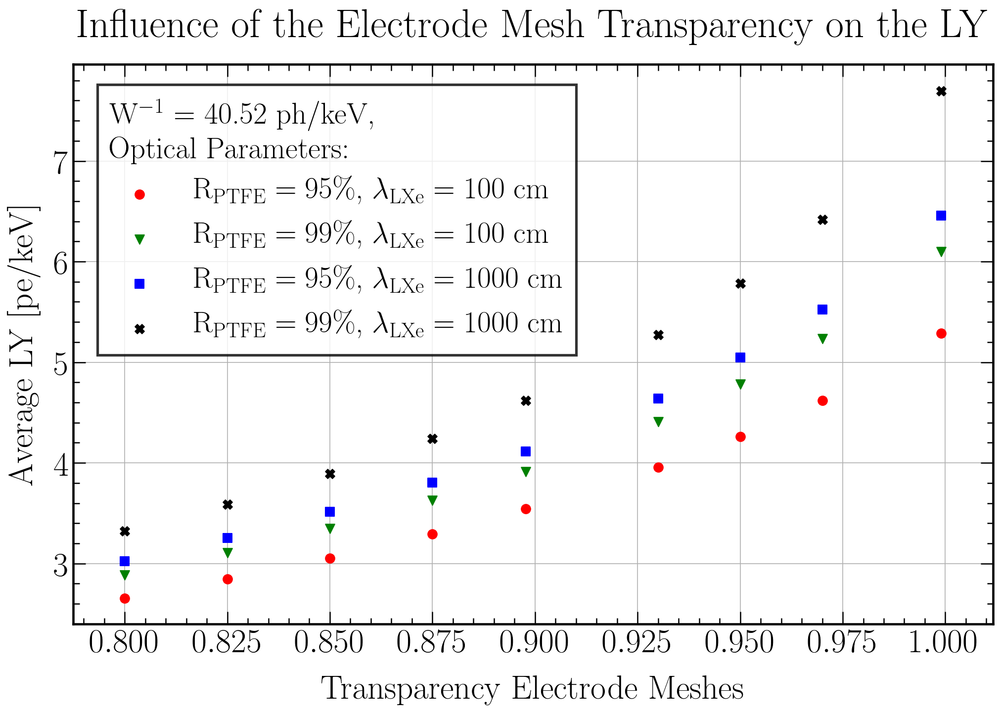

In [64]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the LY', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"Optical Parameters:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_LY.png")
plt.show()

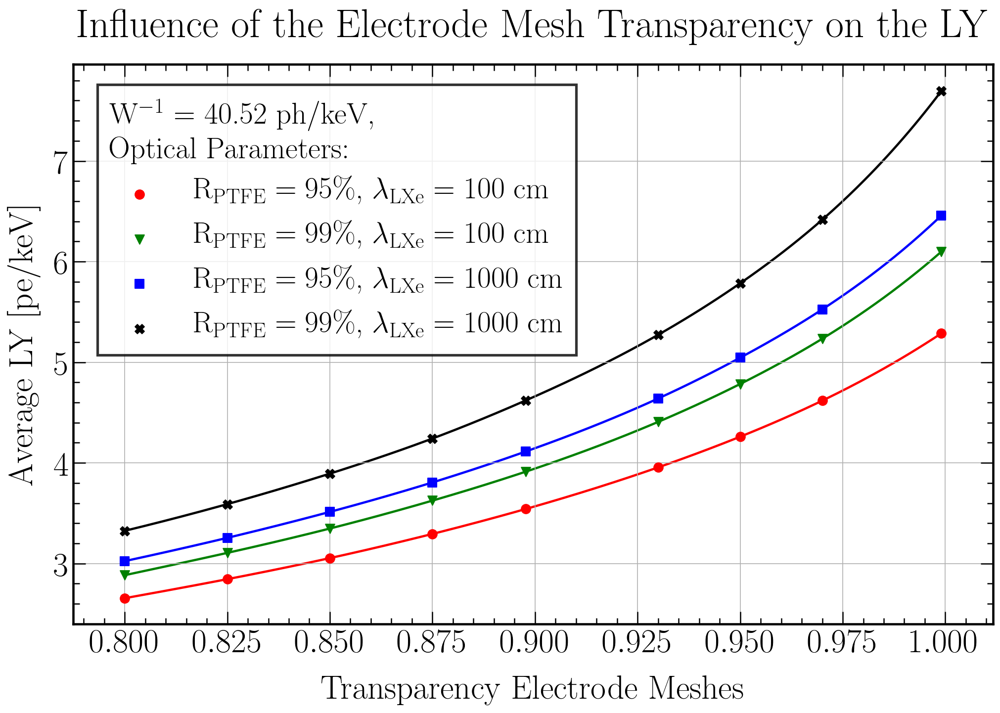

In [65]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'green', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the LY', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"Optical Parameters:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_LY_spline.png")
plt.show()

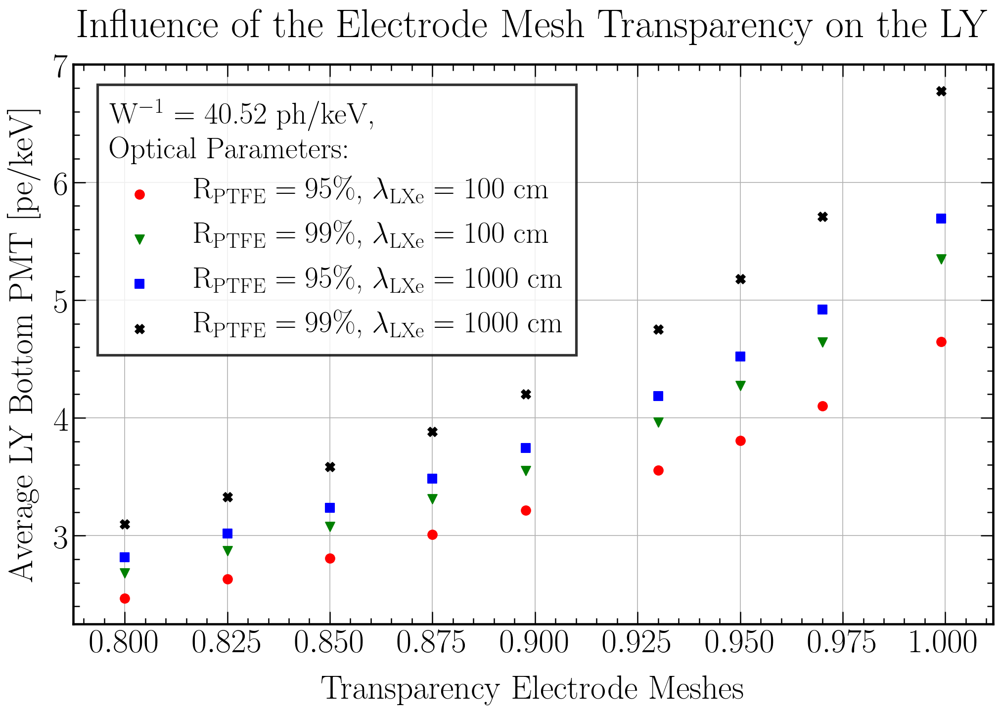

In [66]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the LY', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"Optical Parameters:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_LY_Bottom.png")
plt.show()

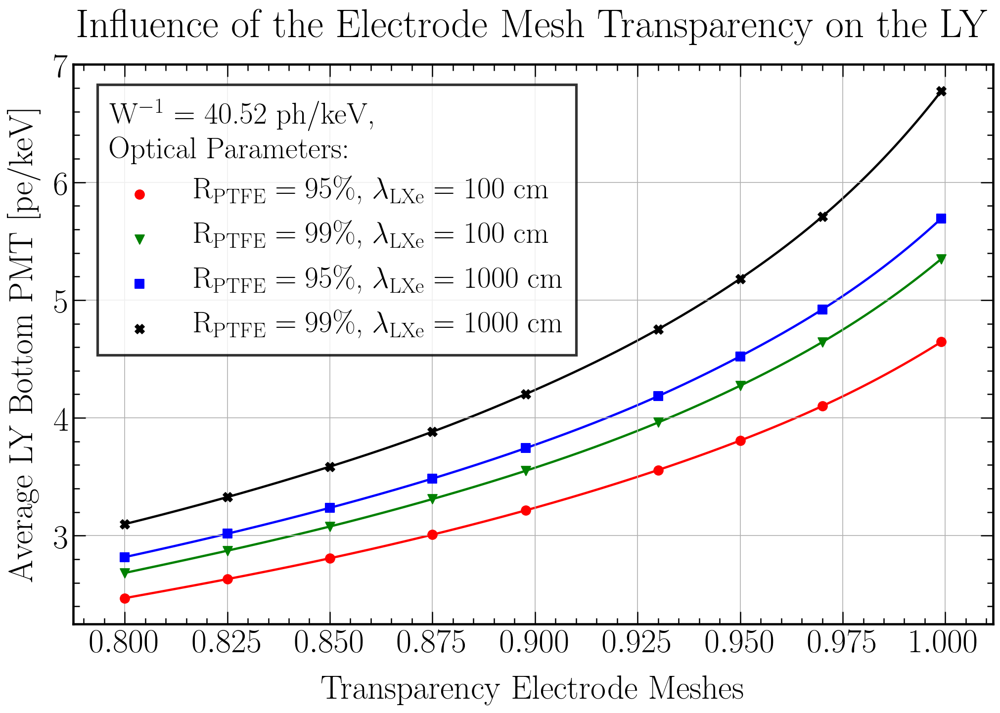

In [67]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'green', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY_b"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the LY', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$^{-1}$ = "+str(round(1/W,2))+" ph/keV,\n"+"Optical Parameters:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_LY_Bottom_spline.png")
plt.show()

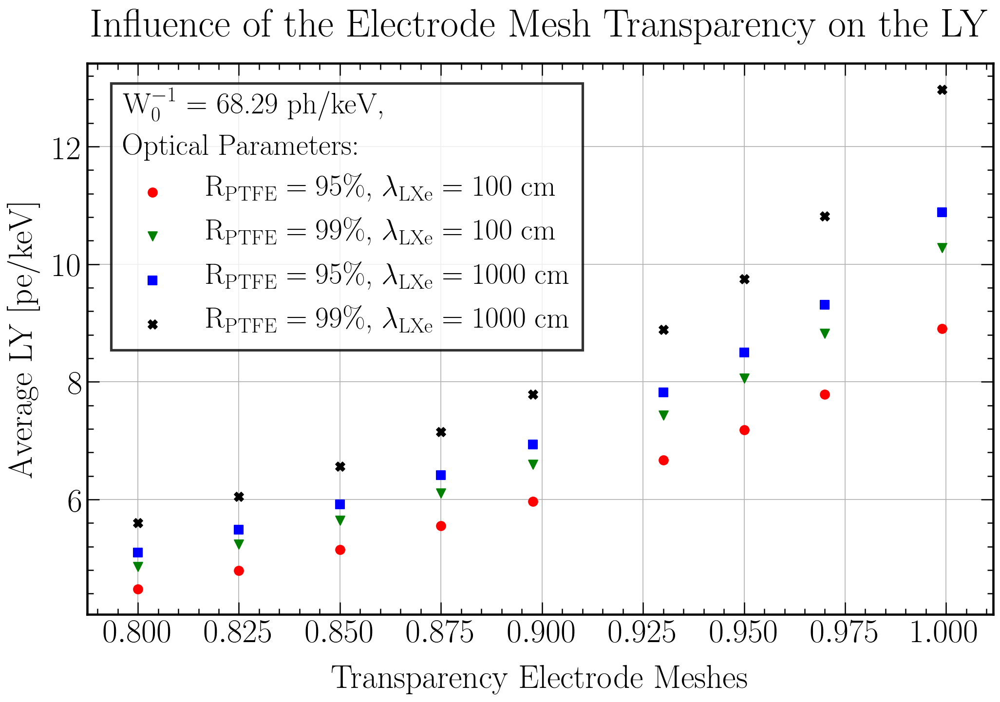

In [68]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the LY', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\nOptical Parameters:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_LY0.png")
plt.show()

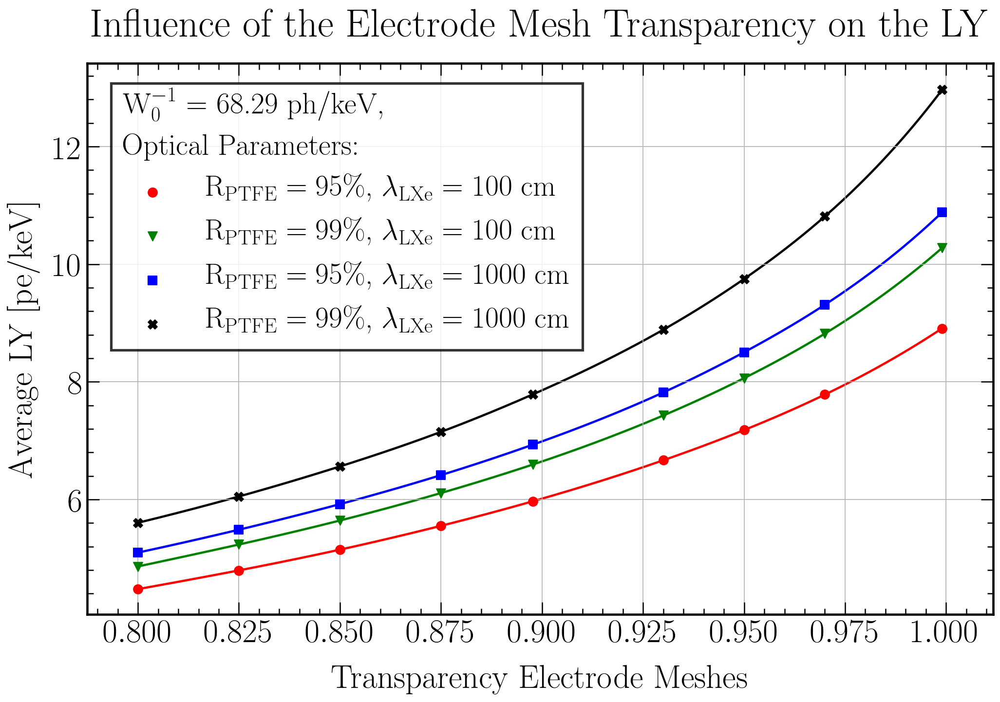

In [69]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'green', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the LY', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\nOptical Parameters:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_LY0_spline.png")
plt.show()

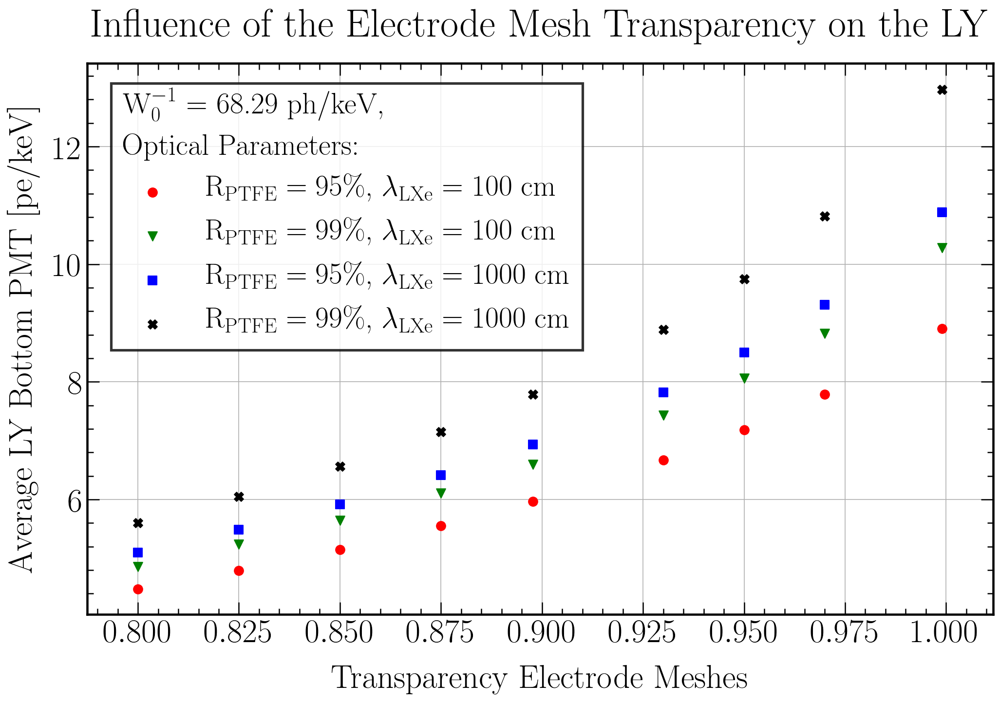

In [70]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the LY', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\nOptical Parameters:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_LY0_Bottom.png")
plt.show()

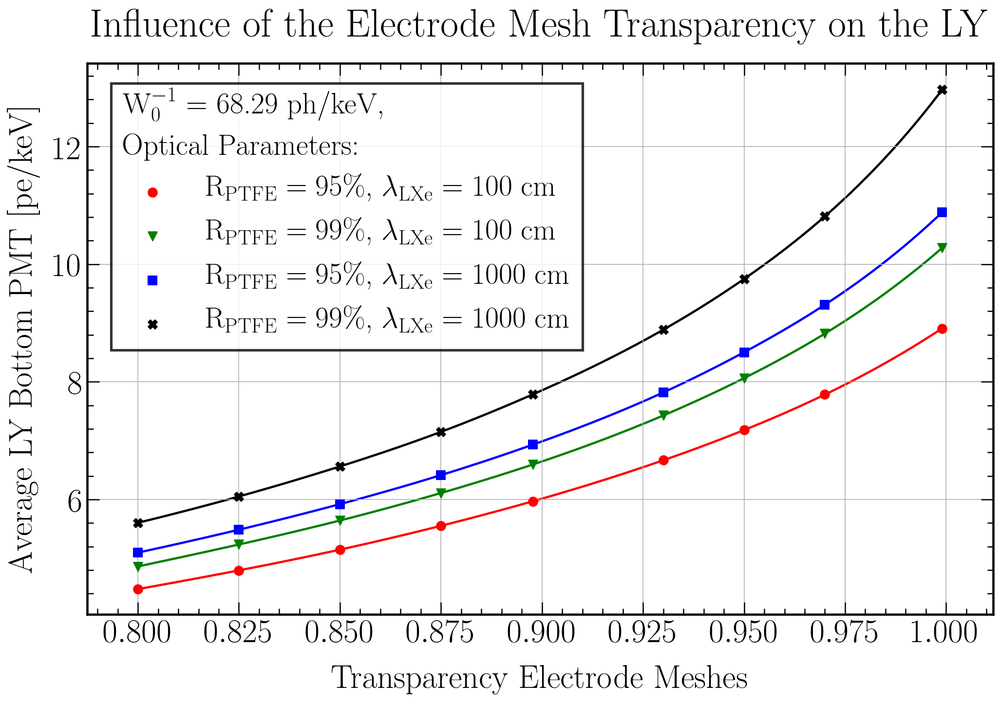

In [71]:
#############################################
## Set plot styles:
#############################################

fig=plt.figure(figsize=(16, 10), dpi=150)

# Text options
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

# Labels
label_size = 32.5 #25
label_pad = 13 #10
title_size = 39 #30
title_pad = 26 #20

# Axes Parameters
axes = plt.gca()
axes.tick_params(axis='both') 

# Axes ---> Linewidth
for axis in ['top','bottom','left','right']:
    axes.spines[axis].set_linewidth(2.2)
    
# Axes ---> Ticks
axes.xaxis.set_minor_locator(AutoMinorLocator(5)) 
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
axes.yaxis.set_minor_locator(AutoMinorLocator(5))
plt.tick_params(which='minor', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=6)
plt.tick_params(which='major', direction='in', labelsize=label_size, top=True, right=True, width=1.2, length=12)

# Grid
plt.grid(True)
    
#############################################
## Plot specific settings and plot data
#############################################

# Data plot
x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "red", s = 80, marker="o")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'red', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 100)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 100$ cm", color = "green", s = 80, marker="v")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'green', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.95) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 95 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "blue", s = 80, marker="s")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'blue', zorder=0)

x = opticals["Tmesh"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
y = opticals["LY0_a"][(opticals["RPTFE"] == 0.99) & (opticals["LXeAbs"] == 1000)]
plt.scatter(x,y, label = "$\mathrm{R}_{\mathrm{PTFE}} = 99 \%$, $\lambda_{\mathrm{LXe}} = 1000$ cm", color = "black", s = 80, marker="X")

xr = remove_duplicate(x.values, x.values)
yr = remove_duplicate(y.values, x.values)
xnew = np.linspace(min(xr), max(xr), 300)
spl = make_interp_spline(sorted(xr), [X for Y, X in sorted(zip(xr, yr))], k=3)
ynew = spl(xnew)
plt.plot(xnew, ynew, linewidth = 2.2, color = 'black', zorder=0)

plt.xlabel('Transparency Electrode Meshes', fontsize = label_size, labelpad = label_pad)
plt.ylabel('Average LY Bottom PMT [pe/keV]', fontsize = label_size, labelpad = label_pad)
plt.title('Influence of the Electrode Mesh Transparency on the LY', fontsize = title_size, pad = title_pad)

#plt.axvline(0.89770509, alpha=0.9, color='dimgrey', linestyle = 'dashed')

# Legend
leg = plt.legend(loc=2, bbox_to_anchor=(0.01,0.99), title="W$_0^{-1}$ = "+str(round(1/W0,2))+" ph/keV,\nOptical Parameters:", fontsize=0.9*label_size, frameon=True, shadow=False, edgecolor='black', fancybox=False)
leg.get_title().set_fontsize(0.9*label_size)
for line in leg.get_lines(): # enumerated
    line.set_linewidth(4)
leg.get_frame().set_linewidth(2.5)
leg._legend_box.align = "left"

# Axes ---> Range
#plt.xlim(-20,520)
#plt.ylim(0,0.4)
#plt.ylim(bottom=0)
#plt.xlim(left=0)
#plt.gca().set_xscale('log')

fig.savefig("Influence_TranspMeshes_LY0_Bottom_spline.png")
plt.show()